# 🌐 Base de Données de l'Étude

## Phase 1: Récupération et Visualisation des Régions de France

Ce code télécharge les données géographiques des régions françaises, calcule leurs centroïdes et affiche une carte. Les centroïdes sont extraits pour chaque région et stockés sous forme de triplets (region, longitude, latitude) pour une utilisation ultérieure.

In [1]:
#Installation des bibliothèques nécessaires pour la récupération et la représentation des données géographiques
!pip install contextily && geopandas &&  topojson && py7zr && openpyxl && tqdm && s3fs && pandas && fiona && shapely && pyproj && rtree
!pip install PyYAML xlrd && git+https://github.com/inseefrlab/cartiflette && git+https://github.com/inseeFrLab/cartiflette.git && openmeteo-requests
!pip install requests-cache retry-requests 
!pip install geopandas 
!pip install cartiflette


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip
'geopandas' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip
'git+https:' n'est pas reconnu en tant que commande interne
ou externe, un programme ex�cutable ou un fichier de commandes.



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

In [3]:
# Récupératoin des données 

from cartiflette import carti_download

france = carti_download(
    values=["France"],
    crs=4326,
    borders="REGION",
    vectorfile_format="geojson",
    simplification=50,
    filter_by="FRANCE_ENTIERE",
    source="EXPRESS-COG-CARTO-TERRITOIRE",
    year=2022,
)


This is an experimental version of cartiflette published on PyPi.
To use the latest stable version, you can install it directly from GitHub with the following command:
pip install git+https://github.com/inseeFrLab/cartiflette.git


In [4]:
france.head()

,INSEE_REG,PAYS,LIBELLE_REGION,POPULATION,SOURCE,geometry
0,1,France,Guadeloupe,384239,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-61.62648 16.27275, -61.62658 ..."
1,3,France,Guyane,281678,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-51.6408 4.21282, -51.64144 4...."
2,2,France,Martinique,364508,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-60.93246 14.7306, -60.9326 14..."
3,6,France,Mayotte,256518,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((45.08357 -12.96139, 45.08547 -..."
4,84,France,Auvergne-Rhône-Alpes,8042936,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"POLYGON ((6.06386 46.41639, 6.06267 46.4168, 6..."


In [5]:
print(france.crs)

EPSG:4326


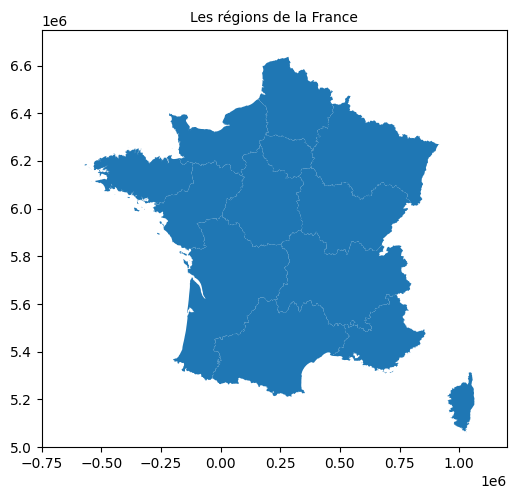

In [6]:
#REPRESENTATION 

if france.crs.to_string() != "EPSG:3857":
    france = france.to_crs(epsg=3857)
#Les  limites de la carte
xmin, xmax = -0.75e6, 1.2e6  # Convertir les limites en mètres (EPSG:3857)
ymin, ymax = 5e6, 6.75e6

#Ploting
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
france.plot(ax=ax)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
plt.title("Les régions de la France", fontsize=10)
plt.show()


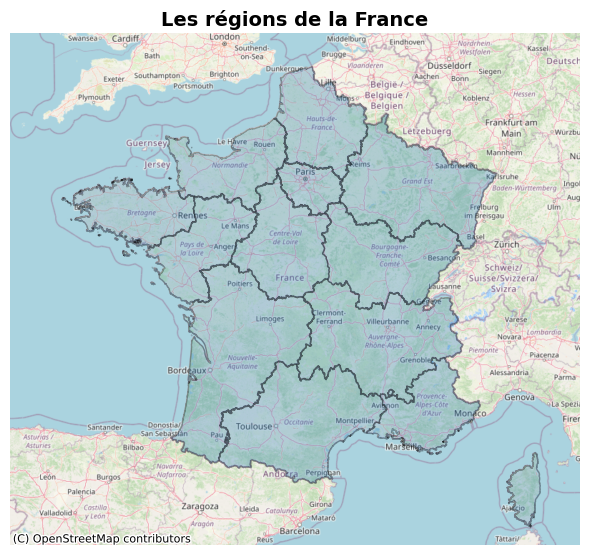

In [7]:
# Ajout d'un fond de carte pour un meilleur contexte géographique
fig, ax = plt.subplots(1, 1, figsize=(6, 6)) 
france.plot(ax=ax, edgecolor='black', linewidth=1, alpha=0.3)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
# 
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=france.crs)
#
plt.title("Les régions de la France", fontsize=14, fontweight='bold')
ax.axis('off') 

plt.tight_layout() 
plt.show()


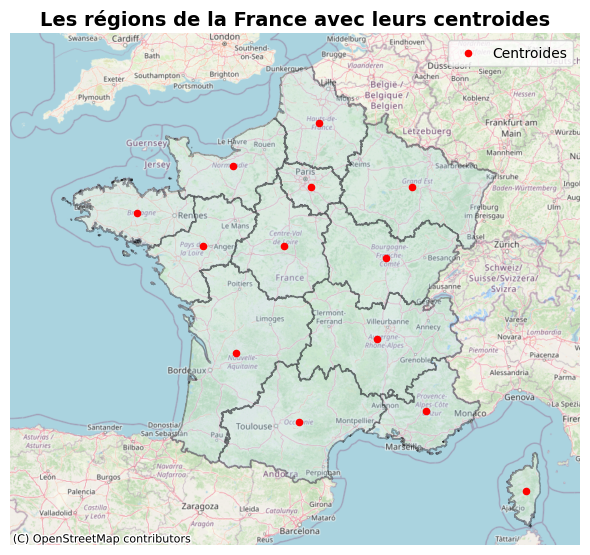

In [8]:
#Représentation des centroides 
france['centroid'] = france.geometry.centroid
france['longitude'] = france.centroid.x
france['latitude'] = france.centroid.y
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
france.plot(ax=ax, edgecolor='black', linewidth=1, alpha=0.3, color='lightblue')
ax.scatter(france['longitude'], france['latitude'], color='red', s=20, label='Centroides')
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=france.crs)
plt.title("Les régions de la France avec leurs centroides", fontsize=14, fontweight='bold')
ax.axis('off')
ax.legend()
plt.tight_layout()
plt.show()

In [9]:
# Calcul des longitudes et latitudes 
france = france.to_crs(epsg=4326)
france['longitude'] = france.geometry.centroid.x
france['latitude'] = france.geometry.centroid.y
print(france[['LIBELLE_REGION', 'longitude', 'latitude']])


                LIBELLE_REGION  longitude   latitude
0                   Guadeloupe -61.539833  16.197646
1                       Guyane -53.239940   3.915167
2                   Martinique -61.019379  14.654871
3                      Mayotte  45.147435 -12.820617
4         Auvergne-Rhône-Alpes   4.536119  45.514642
5                    Occitanie   2.143923  43.702500
6                     Bretagne  -2.841463  48.177549
7           Nouvelle-Aquitaine   0.212719  45.206040
8                    Normandie   0.110932  49.120067
9   Provence-Alpes-Côte d'Azur   6.061005  43.958789
10            Pays de la Loire  -0.816786  47.478104
11                   Grand Est   5.613112  48.688977
12     Bourgogne-Franche-Comté   4.806857  47.234282
13               Île-de-France   2.503401  48.709316
14         Centre-Val de Loire   1.684391  47.484775
15             Hauts-de-France   2.771303  49.969594
16                       Corse   9.106152  42.151511
17                  La Réunion  55.532509 -21.

C:\Users\nouts\AppData\Local\Temp\ipykernel_29208\2487130668.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  france['longitude'] = france.geometry.centroid.x
C:\Users\nouts\AppData\Local\Temp\ipykernel_29208\2487130668.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  france['latitude'] = france.geometry.centroid.y


In [10]:
france.head()

,INSEE_REG,PAYS,LIBELLE_REGION,POPULATION,SOURCE,geometry,centroid,longitude,latitude
0,1,France,Guadeloupe,384239,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-61.62648 16.27275, -61.62658 ...",POINT (-6850582.542 1827642.261),-61.539833,16.197646
1,3,France,Guyane,281678,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-51.6408 4.21282, -51.64144 4....",POINT (-5926644.81 436331.726),-53.239940,3.915167
2,2,France,Martinique,364508,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((-60.93246 14.7306, -60.9326 14...",POINT (-6792650.367 1649468.223),-61.019379,14.654871
3,6,France,Mayotte,256518,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"MULTIPOLYGON (((45.08357 -12.96139, 45.08547 -...",POINT (5025789.843 -1439250.269),45.147435,-12.820617
4,84,France,Auvergne-Rhône-Alpes,8042936,IGN:EXPRESS-COG-CARTO-TERRITOIRE,"POLYGON ((6.06386 46.41639, 6.06267 46.4168, 6...",POINT (504837.95 5704315.458),4.536119,45.514642


In [11]:
# Création de la liste de triplets (région, longitude, latitude)
region_centroides = []
for index, row in france.iterrows():
    region = row['LIBELLE_REGION']  # Nom de la région
    longitude = row['longitude']  # Longitude du centroïde
    latitude = row['latitude']    # Latitude du centroïde
    region_centroides.append((region, longitude, latitude)) # Ajout du triplet à la liste
region_centroides

[('Guadeloupe', -61.53983304107784, 16.197645826552904),
 ('Guyane', -53.23993971851178, 3.915166862499844),
 ('Martinique', -61.019378740773654, 14.654870858984358),
 ('Mayotte', 45.14743542382146, -12.820616875536656),
 ('Auvergne-Rhône-Alpes', 4.536118586333609, 45.51464202656834),
 ('Occitanie', 2.143922833937654, 43.70250024549978),
 ('Bretagne', -2.841462676465886, 48.17754922086023),
 ('Nouvelle-Aquitaine', 0.21271860548694332, 45.2060395396088),
 ('Normandie', 0.11093239896467046, 49.12006667987373),
 ("Provence-Alpes-Côte d'Azur", 6.061004522552231, 43.95878857291765),
 ('Pays de la Loire', -0.81678598261894, 47.47810354487287),
 ('Grand Est', 5.613112231600144, 48.68897740160863),
 ('Bourgogne-Franche-Comté', 4.806856915301157, 47.2342819451994),
 ('Île-de-France', 2.503401392552759, 48.70931550109074),
 ('Centre-Val de Loire', 1.684391322381998, 47.48477508284454),
 ('Hauts-de-France', 2.7713028658475474, 49.969593961262426),
 ('Corse', 9.106151755156151, 42.15151137562012),

## Phase 2: Collecte des Données de Qualité de l'Air 🌍

Ce script permet de collecter des **données horaires sur la qualité de l'air** via l'API Open-Meteo pour différentes régions. Il récupère les principaux polluants (**PM10**, **PM2.5**, **CO**, **NO₂**, **SO₂**, **Ozone**) ainsi que des données climatiques, et les organise dans un tableau structuré pour analyse.

---

### ✨ **Fonctionnalités Principales**
1. **Gestion de Cache** :
   - Réutilisation intelligente des données pour éviter des appels redondants à l'API.  
2. **Réessais Automatiques** :
   - Garantie de fiabilité grâce à une gestion automatique des échecs temporaires.
3. **Organisation Structurée** :
   - Utilisation de **Pandas DataFrames** pour manipuler et analyser les données de manière flexible et efficace.
4. **Extraction des Dates** :
   - Ajout d’une colonne pour isoler la **date** des données horaires.
5. **Fusion des Données** :
   - Consolidation des informations pour une analyse **centralisée et cohérente**.

---


In [12]:
from scripts import api
from scripts.api import * 

In [13]:
var_air=["pm10", "pm2_5", "carbon_dioxide", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]
combined_dataframe_air = api.recup_data("2023-01-01","2024-11-30","https://air-quality-api.open-meteo.com/v1/air-quality",var_air,region_centroides)

In [14]:
combined_dataframe_air

,date,day,region,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone
0,2023-01-01 00:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.500000,11.3,NaN,3.70,0.30,62.0
1,2023-01-01 01:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.700001,11.9,NaN,3.45,0.30,62.0
2,2023-01-01 02:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.799999,12.0,NaN,3.15,0.25,63.0
3,2023-01-01 03:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.700001,11.4,NaN,2.60,0.25,64.0
4,2023-01-01 04:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,19.400000,10.7,NaN,2.10,0.25,64.0
...,...,...,...,...,...,...,...,...,...,...,...
302395,2024-11-30 19:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,10.000000,7.1,459.0,3.60,2.50,56.0
302396,2024-11-30 20:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.800000,7.1,455.0,4.20,2.30,52.0
302397,2024-11-30 21:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.700000,7.0,453.0,4.50,2.20,49.0
302398,2024-11-30 22:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.500000,6.9,455.0,4.40,2.10,47.0


In [15]:
var_climat=["temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]
combined_dataframe_climat = api.recup_data("2023-01-01","2024-11-30","https://archive-api.open-meteo.com/v1/archive",var_climat,region_centroides)
combined_dataframe_climat = combined_dataframe_climat.drop(columns=["region","date","day"])

In [16]:
df_hourly=pd.concat([combined_dataframe_air,combined_dataframe_climat],axis=1)
df_hourly

,date,day,region,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01 00:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.500000,11.3,NaN,3.70,0.30,62.0,-61.539833,16.197646,23.770000,84.863304,0.0,1017.400024,9.422101
1,2023-01-01 01:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.700001,11.9,NaN,3.45,0.30,62.0,-61.539833,16.197646,23.719999,85.643173,0.0,1017.599976,9.885262
2,2023-01-01 02:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,21.799999,12.0,NaN,3.15,0.25,63.0,-61.539833,16.197646,23.520000,86.947586,0.0,1017.700012,9.720000
3,2023-01-01 03:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,20.700001,11.4,NaN,2.60,0.25,64.0,-61.539833,16.197646,23.270000,88.269188,0.0,1017.400024,7.559999
4,2023-01-01 04:00:00+00:00,2023-01-01,Guadeloupe,-61.539833,16.197646,19.400000,10.7,NaN,2.10,0.25,64.0,-61.539833,16.197646,22.469999,94.082932,0.2,1017.299988,8.825508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302395,2024-11-30 19:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,10.000000,7.1,459.0,3.60,2.50,56.0,55.532509,-21.133203,10.291500,93.833534,0.0,824.523071,3.617955
302396,2024-11-30 20:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.800000,7.1,455.0,4.20,2.30,52.0,55.532509,-21.133203,9.891500,93.814590,0.0,823.957458,3.847960
302397,2024-11-30 21:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.700000,7.0,453.0,4.50,2.20,49.0,55.532509,-21.133203,9.391500,97.342743,0.0,823.007019,3.065289
302398,2024-11-30 22:00:00+00:00,2024-11-30,La Réunion,55.532509,-21.133203,9.500000,6.9,455.0,4.40,2.10,47.0,55.532509,-21.133203,8.891500,99.663048,0.0,822.137085,2.979530


In [17]:
# Agrégation par 'day' et 'region' en prenant la moyenne
df = df_hourly.groupby(['day', 'region']).mean().reset_index()

# 📊 ANALYSE EXPLORATOIRE

Cette analyse explore les données en **panel** afin de comprendre les tendances, les relations entre variables et les spécificités régionales et temporelles. 

Elle sert également de base à la préparation des données pour la modélisation prédictive.

---

## **1. Exploration de base des données**



#### 🌍 Filtrage des Données : Régions Européennes

Dans cette étape, nous avons filtré les données pour ne conserver que les régions françaises situées en Europe. Ce filtrage est essentiel pour se concentrer sur les régions métropolitaines et éviter de mélanger les données avec celles des régions d'outre-mer.

---

    **1. Liste des Régions Européennes**
Voici les 13 régions métropolitaines françaises incluses dans l'analyse :

1. Auvergne-Rhône-Alpes  
2. Bourgogne-Franche-Comté  
3. Bretagne  
4. Centre-Val de Loire  
5. Corse  
6. Grand Est  
7. Hauts-de-France  
8. Île-de-France  
9. Normandie  
10. Nouvelle-Aquitaine  
11. Occitanie  
12. Pays de la Loire  
13. Provence-Alpes-Côte d'Azur  

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import scripts
from scripts import dataviz

In [19]:

regions_europe = ["Auvergne-Rhône-Alpes","Bourgogne-Franche-Comté","Bretagne","Centre-Val de Loire","Corse","Grand Est","Hauts-de-France","Île-de-France","Normandie","Nouvelle-Aquitaine","Occitanie","Pays de la Loire",
    "Provence-Alpes-Côte d'Azur"
]

# Filtrage des régions européennes
df1 = df[df['region'].isin(regions_europe)]



In [20]:
df1.head()

,day,region,date,longitude,latitude,pm10,pm2_5,carbon_dioxide,nitrogen_dioxide,sulphur_dioxide,ozone,longitude,latitude,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,2023-01-01,Auvergne-Rhône-Alpes,2023-01-01 11:30:00+00:00,4.536119,45.514642,14.954166,7.858334,NaN,3.475000,0.837500,62.250000,4.536119,45.514642,11.954083,71.024551,0.000000,964.791809,23.574928
1,2023-01-01,Bourgogne-Franche-Comté,2023-01-01 11:30:00+00:00,4.806857,47.234282,13.300000,7.737500,NaN,3.795833,0.741667,59.541668,4.806857,47.234282,10.743833,77.391754,0.000000,963.939941,20.494823
2,2023-01-01,Bretagne,2023-01-01 11:30:00+00:00,-2.841463,48.177549,9.845834,5.720833,NaN,3.395833,0.270833,64.916664,-2.841463,48.177549,10.547750,89.859863,0.358333,998.909729,18.512320
3,2023-01-01,Centre-Val de Loire,2023-01-01 11:30:00+00:00,1.684391,47.484775,13.750000,7.679167,NaN,2.837500,0.770833,52.958332,1.684391,47.484775,14.431666,66.970406,0.000000,1004.533508,18.958830
4,2023-01-01,Corse,2023-01-01 11:30:00+00:00,9.106152,42.151511,8.979167,5.345833,NaN,2.208333,0.341667,52.833332,9.106152,42.151511,6.793917,73.633392,0.000000,841.699280,4.792229


In [21]:
df1.shape

(9100, 18)

In [22]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9100 entries, 0 to 12599
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   day                   9100 non-null   object             
 1   region                9100 non-null   object             
 2   date                  9100 non-null   datetime64[ns, UTC]
 3   longitude             9100 non-null   float64            
 4   latitude              9100 non-null   float64            
 5   pm10                  9100 non-null   float32            
 6   pm2_5                 9100 non-null   float32            
 7   carbon_dioxide        468 non-null    float32            
 8   nitrogen_dioxide      9100 non-null   float32            
 9   sulphur_dioxide       9100 non-null   float32            
 10  ozone                 9100 non-null   float32            
 11  longitude             9100 non-null   float64            
 12  latitude  

####  🔍 Vérification de la structure des données panel

Nous allons vérifier si chaque combinaison region et day est unique

In [23]:
print(df1.groupby(['region', 'day']).size())
duplicates = df1.groupby(['region', 'day']).size()
print((duplicates > 1).sum())  # Vérifie combien de combinaisons ont plus d'une observation

region                day       
Auvergne-Rhône-Alpes  2023-01-01    1
                      2023-01-02    1
                      2023-01-03    1
                      2023-01-04    1
                      2023-01-05    1
                                   ..
Île-de-France         2024-11-26    1
                      2024-11-27    1
                      2024-11-28    1
                      2024-11-29    1
                      2024-11-30    1
Length: 9100, dtype: int64
0


### 🔍 Valeurs manquantes

In [24]:
df1.isnull().sum() / len(df1) * 100

day                      0.000000
region                   0.000000
date                     0.000000
longitude                0.000000
latitude                 0.000000
pm10                     0.000000
pm2_5                    0.000000
carbon_dioxide          94.857143
nitrogen_dioxide         0.000000
sulphur_dioxide          0.000000
ozone                    0.000000
longitude                0.000000
latitude                 0.000000
temperature_2m           0.000000
relative_humidity_2m     0.000000
precipitation            0.000000
surface_pressure         0.000000
wind_speed_10m           0.000000
dtype: float64

 **2. Observations Clés**
1. **Absence de valeurs manquantes** :  
   - La majorité des variables ne contiennent **aucune valeur manquante**, ce qui garantit une bonne qualité des données pour ces dimensions.

2. **Problème majeur avec `carbon_dioxide`** :  
   - Cette variable présente **94.86% de valeurs manquantes**, ce qui rend son utilisation directe problématique.
   - Nous allons donc supprimer cette colonne .

In [25]:
df1 = df1.drop(columns="carbon_dioxide")
df_hourly =df_hourly.drop(columns="carbon_dioxide")

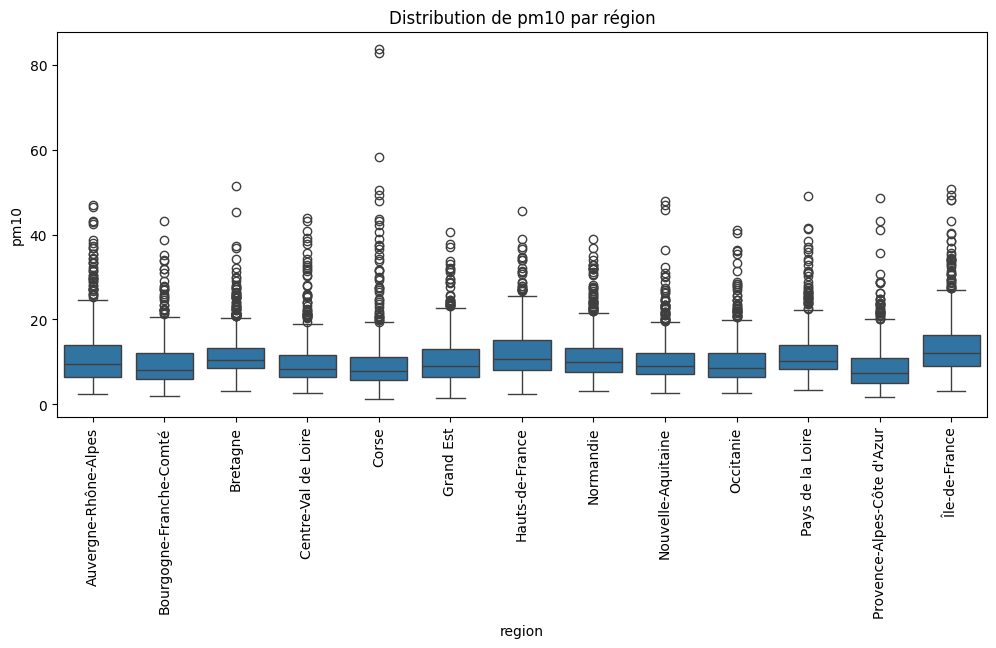

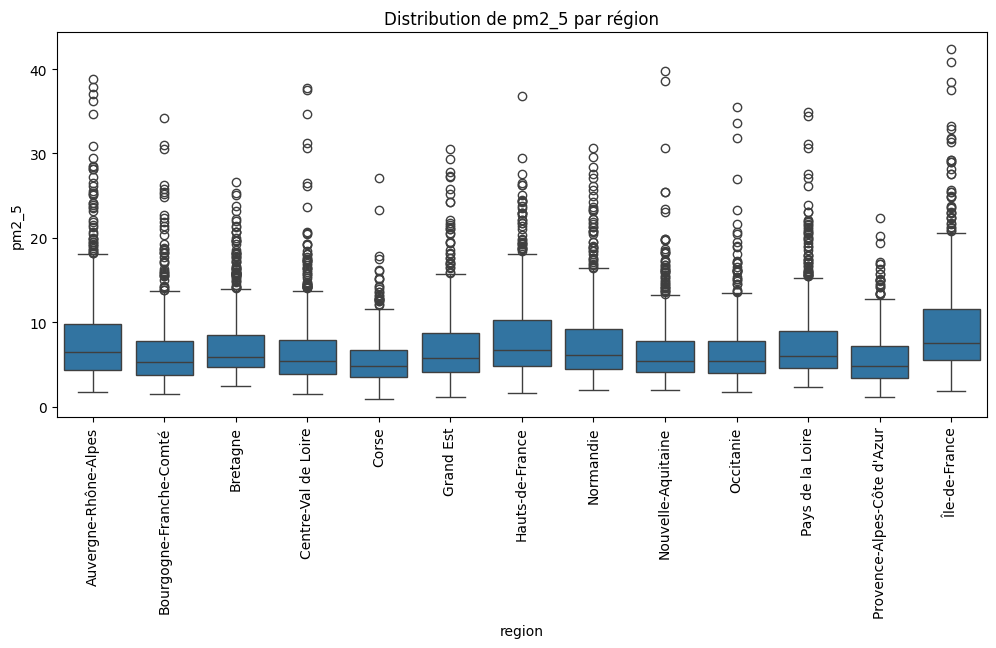

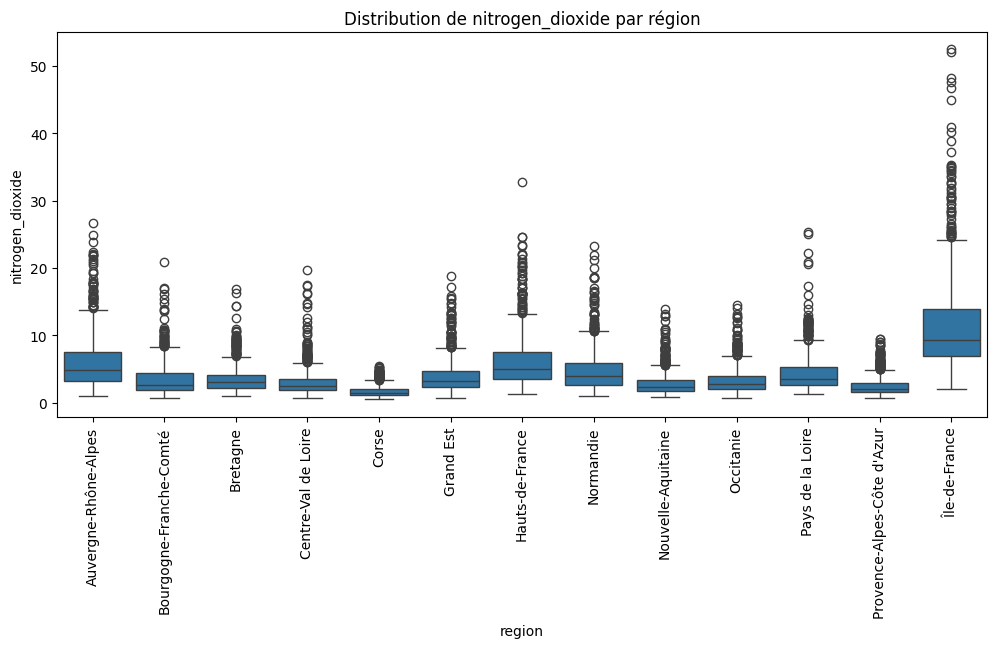

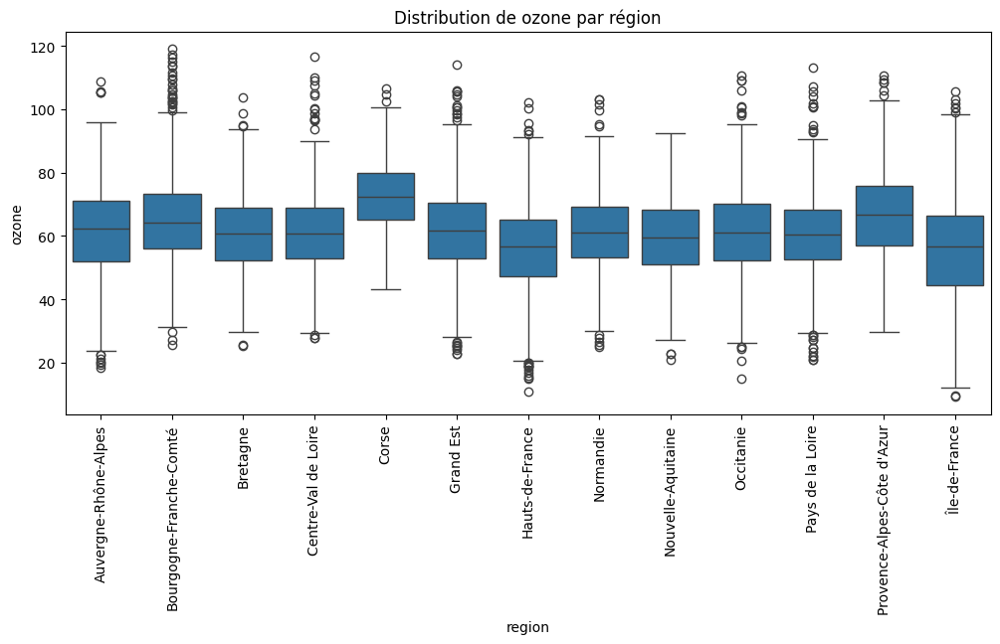

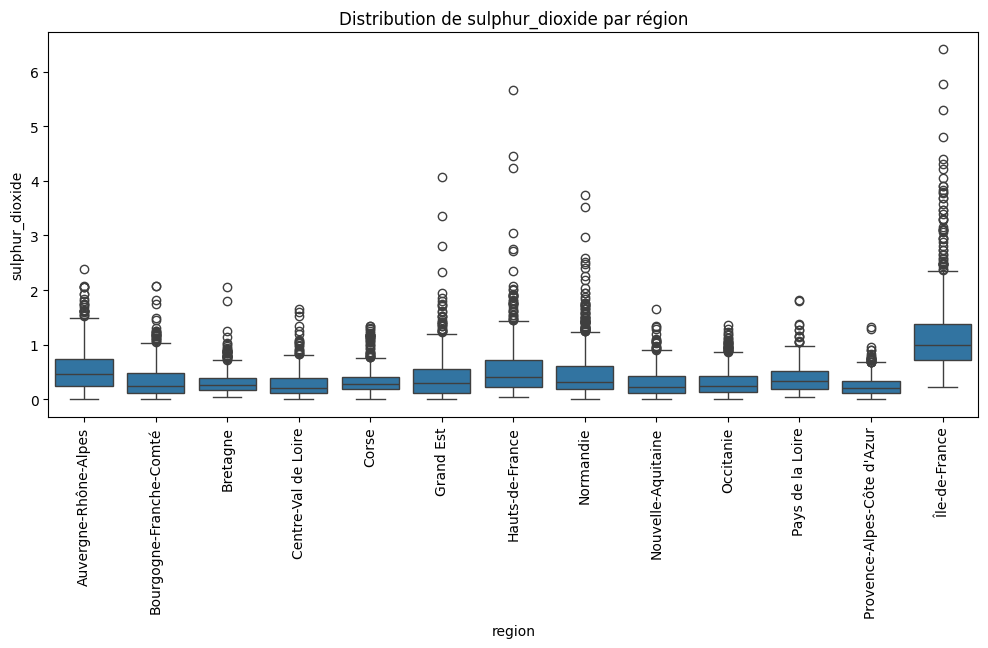

In [26]:
variables = ['pm10', 'pm2_5', 'nitrogen_dioxide', 'ozone', 'sulphur_dioxide']

# Visualisation des distributions des variables pour chaque région
for var in variables:
    plt.figure(figsize=(12, 5))
    sns.boxplot(x='region', y=var, data=df1)
    plt.title(f'Distribution de {var} par région')
    plt.xticks(rotation=90)
    plt.show()

Comme il était attendu, les niveaux de pollutions sont **plus élevés** pour la région **Île-de-France**, très industrialisée. Elle présente notamment des **valeurs médianes plus élevées** pour tous les polluants, à l'exception de l'ozone. De plus, l'étendue des boîtes pour l'Île-de-France, souvent **plus longue** que les autres, montre une **fluctuation plus importante** des concentrations des gaz polluants dans cette région. Cela peut être expliqué par des **épisodes de pollution de l'air**, particulièrement fréquents pendant les périodes de **forte chaleur** 🔥, qui provoquent des **pics de concentration** suivis de baisses, augmentant ainsi la variabilité observée dans les données.

La région **Hauts-de-France**, quant à elle, apparaît comme la **région la plus polluée** après l'Île-de-France, avec des tendances similaires de fortes fluctuations. 

Les **PM10** et **PM2.5** se distinguent comme les gaz polluants avec le plus de **valeurs aberrantes**, notamment en hiver, où le **chauffage au bois** et les **combustibles fossiles** sont couramment utilisés. Ces sources constituent une contribution importante aux concentrations de PM10 et PM2.5. Par ailleurs, les **pratiques agricoles**, qui sont **saisonnières**, avec l'utilisation de machines lourdes, participent également aux émissions, en particulier au printemps et en automne 🚜.

L’ozone, quant à lui, présente une particularité : il s'agit du seul gaz où l’on observe des **valeurs aberrantes à la baisse**. Ces baisses peuvent s'expliquer par des périodes de **fortes pluies** 🌧️ et de **faibles températures**, qui réduisent la formation d'ozone. L'humidité et le froid bloquent les réactions chimiques nécessaires à sa production dans l'air.

Ces statistiques ont pour but de détecter les valeurs aberrantes, mais une question importante se pose : **est-ce que ces valeurs ne pourraient pas, en réalité, nous aider dans l’analyse**, compte tenu du contexte des données de pollution et des conditions climatiques 🌍 ?


#### Importance des valeurs aberrantes (outliers) dans l’analyse des données de pollution et climatiques

 1. 📊 Indicateurs d’événements extrêmes  
Les valeurs aberrantes peuvent refléter des événements exceptionnels tels que :  
- **Pollution accrue** : incendies, tempêtes de sable, activités industrielles.  
- **Conditions climatiques inhabituelles** : vagues de chaleur 🌡️, tempêtes 🌬️, pluies torrentielles 🌧️.  
Ces événements ont des impacts significatifs sur la santé humaine, les écosystèmes et les infrastructures.
---

 2. 🗺️ Renseignent sur des problèmes locaux  
Les outliers peuvent indiquer des problématiques spécifiques :  
- Pics de **PM2.5** ou **PM10** liés à des activités industrielles 🏭 ou à la circulation routière 🚗.  
- Anomalies de température ou de précipitations révélant des **changements locaux**.
---

 3. 🧠 Aident à améliorer les modèles prédictifs  
- Ignorer ou mal traiter les outliers peut **biaiser les modèles** d’analyse.  
- Leur prise en compte permet de construire des modèles **plus robustes** capables de gérer des variations inattendues.  
- Ils peuvent indiquer des **facteurs supplémentaires** à intégrer dans les analyses pour mieux capturer la complexité des phénomènes.
---

 4. 🔍 Révèlent des tendances émergentes  
- Les anomalies peuvent être des indices de **tendances émergentes**, comme :  
  - Une **augmentation progressive de la pollution** liée à des changements d’activités humaines.  
  - Des **signes de changements climatiques**, tels que la hausse des températures ou des variations dans les cycles de précipitation.
---

 5. ❤️ Impact sur la santé et la planification  
- Les **pics de pollution** ont des conséquences graves :  
  - Déclenchement d’**alertes de qualité de l’air** pour protéger les populations vulnérables.  
  - **Gestion améliorée des ressources** face aux conditions météorologiques extrêmes.  
---

 6. 🌱 Prise en compte dans les politiques environnementales  
Les valeurs aberrantes sont essentielles pour formuler des politiques efficaces :  
- **Identification des périodes ou lieux** nécessitant des interventions spécifiques.  
- **Justification des actions climatiques** ou des mesures de réduction de la pollution pour répondre à des défis spécifiques.
---

Les valeurs aberrantes ne sont pas seulement des anomalies statistiques : elles contiennent des informations critiques sur les événements extrêmes, les problématiques locales, et les tendances émergentes. Leur analyse approfondie peut orienter les politiques environnementales, la planification urbaine et les modèles climatiques pour mieux répondre aux défis environnementaux actuels. 🌍


## 🌍 Calcul de l'Indice ATMO

L'**indice ATMO** est utilisé en France pour évaluer la qualité de l'air en se basant sur cinq principaux polluants : **PM10**, **PM2.5**, **NO₂**, **O₃**, et **SO₂**. 

Il synthétise ces données en un indicateur unique, simple à interpréter.

---

 🛠️ **Méthode de Calcul**

 **1. Calcul des Sous-Indices**
Chaque polluant se voit attribuer un **sous-indice** en fonction de sa concentration moyenne journalière 

(ou glissante pour certains polluants). Les seuils sont définis comme suit :

| **Sous-indice** | **PM10 (µg/m³)** | **PM2.5 (µg/m³)** | **NO₂ (µg/m³)** | **O₃ (µg/m³)** | **SO₂ (µg/m³)** |
|-----------------|------------------|-------------------|-----------------|----------------|-----------------|
| 1 (Très bon)   | 0 - 6            | 0 - 5             | 0 - 29          | 0 - 29         | 0 - 39          |
| 2              | 7 - 13           | 6 - 10            | 30 - 54         | 30 - 54        | 40 - 79         |
| 3              | 14 - 20          | 11 - 15           | 55 - 84         | 55 - 79        | 80 - 119        |
| 4              | 21 - 27          | 16 - 20           | 85 - 109        | 80 - 104       | 120 - 159       |
| 5              | 28 - 34          | 21 - 25           | 110 - 134       | 105 - 129      | 160 - 199       |
| 6              | 35 - 41          | 26 - 30           | 135 - 164       | 130 - 149      | 200 - 249       |
| 7              | 42 - 49          | 31 - 40           | 165 - 199       | 150 - 179      | 250 - 299       |
| 8              | 50 - 64          | 41 - 50           | 200 - 274       | 180 - 209      | 300 - 399       |
| 9              | 65 - 79          | 51 - 75           | 275 - 399       | 210 - 239      | 400 - 499       |
| 10 (Très mauvais) | ≥ 80          | ≥ 76              | ≥ 400           | ≥ 240          | ≥ 500           |

 **2. Détermination de l'Indice Final**
L'**indice ATMO** correspond au **sous-indice le plus élevé** parmi les cinq polluants mesurés sur une journée. 

Cela signifie que le polluant le plus préoccupant domine l'indicateur global.

---

### 📊 **Échelle de Qualité de l'Air**

| **Indice ATMO** | **Niveau de Qualité** | **Couleur Associée** |
|------------------|-----------------------|-----------------------|
| 1-2             | Très bon              | 🟢 Vert clair         |
| 3-4             | Bon                   | 🟢 Vert               |
| 5               | Moyen                 | 🟡 Jaune              |
| 6-7             | Médiocre              | 🟠 Orange             |
| 8-9             | Mauvais               | 🔴 Rouge              |
| 10              | Très mauvais          | 🟣 Violet             |

---

 🔗 **Référence Officielle**
Pour plus de détails, consultez la page officielle de l'indice ATMO sur [Atmo France](https://www.atmo-france.org/article/lindice-atmo).

---


In [27]:
from scripts import indice
df_final = indice.atmo(df_hourly=df_hourly, regions=regions_europe)

In [28]:
df_final.head()

,day,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
2800,2023-01-01,Auvergne-Rhône-Alpes,14.954166,7.858334,3.475000,65.125,0.837500,11.954083,71.024551,0.000000,964.791809,23.574928,3,2,1,3,1,3
2801,2023-01-02,Auvergne-Rhône-Alpes,14.316667,7.962500,5.904167,71.000,0.933333,10.583250,76.024849,0.550000,965.794250,15.330505,3,2,1,3,1,3
2802,2023-01-03,Auvergne-Rhône-Alpes,8.666667,6.525000,11.420834,53.750,0.729167,6.727000,87.053253,0.125000,971.449707,5.034335,2,2,1,2,1,2
2803,2023-01-04,Auvergne-Rhône-Alpes,15.504167,11.441667,17.929167,37.875,1.075000,5.220750,84.029167,0.000000,972.121399,4.557892,3,3,1,2,1,3
2804,2023-01-05,Auvergne-Rhône-Alpes,11.616666,9.070833,12.416667,44.375,0.725000,7.531167,89.476860,0.016667,968.975586,5.073804,2,2,1,2,1,2


In [29]:
df_final.describe()

,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
count,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.000000,9100.00000,9100.0,9100.000000
mean,10.907528,7.113768,4.518834,74.675422,0.442049,12.377439,76.972610,0.120589,977.221863,11.768193,2.212088,1.888681,1.003626,3.31989,1.0,3.498791
std,6.222834,4.548127,4.211990,17.035211,0.446411,6.485336,11.364951,0.240779,48.221287,5.837454,0.929465,0.981320,0.060113,0.74320,0.0,0.790160
min,1.141667,0.850000,0.508333,17.125000,0.000000,-7.760250,20.433760,0.000000,806.494568,1.490240,1.000000,1.000000,1.000000,1.00000,1.0,2.000000
25%,6.933333,4.200000,2.070833,64.250000,0.166667,7.808958,70.551474,0.000000,961.561111,7.297564,2.000000,1.000000,1.000000,3.00000,1.0,3.000000
50%,9.341666,5.795834,3.135417,73.875000,0.308333,12.212584,78.623955,0.016667,994.546631,10.590815,2.000000,2.000000,1.000000,3.00000,1.0,3.000000
75%,13.070834,8.529166,5.433333,84.781250,0.562500,17.388834,85.422457,0.137500,1006.645447,15.156949,3.000000,2.000000,1.000000,4.00000,1.0,4.000000
max,83.650002,42.333332,52.420834,161.500000,6.408333,30.983335,99.779869,3.450000,1038.322388,41.020008,10.000000,8.000000,2.000000,7.00000,1.0,10.000000


### 📊 Statistiques Descriptives des Régions Européennes

Les statistiques ci-dessous présentent un résumé des variables clés collectées pour les 13 régions métropolitaines françaises sur la période donnée.

---

#### **1. Pollution Atmosphérique**

| **Variable**            | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|--------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **PM10** (µg/m³)         | 9,100     | 10.91    | 6.22     | 1.14      | 6.93      | 9.34      | 13.07     | 83.65     |
| **PM2.5** (µg/m³)        | 9,100     | 7.11     | 4.55     | 0.85      | 4.20      | 5.80      | 8.53      | 42.33     |
| **Dioxyde d'Azote** (µg/m³) | 9,100  | 4.52     | 4.21     | 0.51      | 2.07      | 3.14      | 5.43      | 52.42     |
| **Ozone** (µg/m³)        | 9,100     | 74.68    | 17.03    | 17.13     | 64.25     | 73.88     | 84.78     | 161.50    |
| **Dioxyde de Soufre** (µg/m³) | 9,100 | 0.44     | 0.45     | 0.00      | 0.17      | 0.31      | 0.56      | 6.41      |
| **Monoxyde de Carbone** (µg/m³) | 9,100 | 154.63 | 31.88    | 87.92     | 132.86    | 150.21    | 169.46    | 428.00    |
---

#### **2. Variables Météorologiques**

| **Variable**                | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|-----------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Température à 2m** (°C)   | 9,100     | 12.38    | 6.49     | -7.76     | 7.81      | 12.21     | 17.39     | 30.98     |
| **Humidité Relative** (%)   | 9,100     | 76.97    | 11.36    | 20.43     | 70.55     | 78.62     | 85.42     | 99.78     |
| **Pression au Sol** (hPa)   | 9,100     | 977.22   | 48.22    | 806.49    | 961.56    | 994.55    | 1006.65   | 1038.32   |
| **Vent à 10m** (m/s)        | 9,100     | 11.77    | 5.84     | 1.49      | 7.30      | 10.59     | 15.16     | 41.02     |

---

#### **3. Variables du Sol**

| **Variable**                       | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|------------------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Température du Sol (0-7cm)** (°C)| 9,100     | 12.68    | 6.60     | -3.18     | 7.90      | 12.43     | 17.87     | 31.14     |
| **Humidité du Sol (0-7cm)** (m³/m³)| 9,100     | 0.33     | 0.08     | 0.06      | 0.28      | 0.35      | 0.39      | 0.51      |

---

#### **4. Sous-Indices et Indice ATMO**

| **Variable**            | **Count** | **Mean** | **Std**  | **Min**   | **25%**   | **50%**   | **75%**   | **Max**   |
|--------------------------|-----------|----------|----------|-----------|-----------|-----------|-----------|-----------|
| **Sous-indice PM10**     | 9,100     | 2.21     | 0.93     | 1.00      | 2.00      | 2.00      | 3.00      | 10.00     |
| **Sous-indice PM2.5**    | 9,100     | 1.89     | 0.98     | 1.00      | 1.00      | 2.00      | 2.00      | 8.00      |
| **Sous-indice NO2**      | 9,100     | 1.00     | 0.06     | 1.00      | 1.00      | 1.00      | 1.00      | 2.00      |
| **Sous-indice O3**       | 9,100     | 3.32     | 0.74     | 1.00      | 3.00      | 3.00      | 4.00      | 7.00      |
| **Sous-indice SO2**      | 9,100     | 1.00     | 0.00     | 1.00      | 1.00      | 1.00      | 1.00      | 1.00      |
| **Indice ATMO**          | 9,100     | 3.50     | 0.79     | 2.00      | 3.00      | 3.00      | 4.00      | 10.00     |

---

#### **Observations Clés**
1. **Polluants :**
   - Les **PM10** et **PM2.5** ont des moyennes modérées mais des maximums élevés, reflétant des pics de pollution dans certaines régions.
   - Les sous-indices pour le **dioxyde de soufre** restent constants à `1`, indiquant des concentrations très faibles dans toutes les régions.

2. **Météorologie :**
   - La **température moyenne** à 2m est d'environ 12.4°C, avec des variations saisonnières marquées.
   - Le vent est modéré en moyenne, mais des rafales atteignant 41 m/s ont été observées.

3. **Indice ATMO :**
   - La majorité des jours ont un indice ATMO de `3` ou `4`, correspondant à une qualité de l'air moyenne ou légèrement médiocre.
   - Quelques jours présentent un indice ATMO élevé (`10`), indiquant une qualité de l'air très mauvaise.



In [30]:
df1=df_final

In [31]:
df1.insert(1,"month",df["date"].dt.month)
month_dict = {
    1: 'janvier', 2: 'février', 3: 'mars', 4: 'avril', 5: 'mai', 
    6: 'juin', 7: 'juillet', 8: 'août', 9: 'septembre', 10: 'octobre', 
    11: 'novembre', 12: 'décembre'
}

In [32]:
df1.head()

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
2800,2023-01-01,6,Auvergne-Rhône-Alpes,14.954166,7.858334,3.475000,65.125,0.837500,11.954083,71.024551,0.000000,964.791809,23.574928,3,2,1,3,1,3
2801,2023-01-02,6,Auvergne-Rhône-Alpes,14.316667,7.962500,5.904167,71.000,0.933333,10.583250,76.024849,0.550000,965.794250,15.330505,3,2,1,3,1,3
2802,2023-01-03,6,Auvergne-Rhône-Alpes,8.666667,6.525000,11.420834,53.750,0.729167,6.727000,87.053253,0.125000,971.449707,5.034335,2,2,1,2,1,2
2803,2023-01-04,6,Auvergne-Rhône-Alpes,15.504167,11.441667,17.929167,37.875,1.075000,5.220750,84.029167,0.000000,972.121399,4.557892,3,3,1,2,1,3
2804,2023-01-05,6,Auvergne-Rhône-Alpes,11.616666,9.070833,12.416667,44.375,0.725000,7.531167,89.476860,0.016667,968.975586,5.073804,2,2,1,2,1,2


### 📈    Visualisation des Tendances Temporelles des Polluants Atmosphériques

In [33]:
polluants = ['pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']
time_trends = df_final.groupby('day')[polluants].mean()

c:\Users\nouts\OneDrive\Desktop\Projet_Python_2024\scripts\dataviz.py:60: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


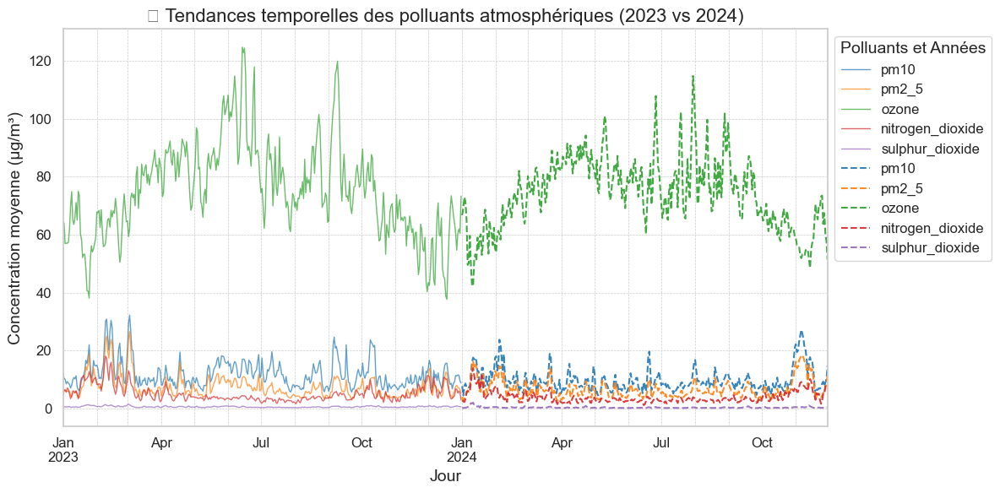

In [34]:
time_trends.index = pd.to_datetime(time_trends.index)
time_trends_2023 = time_trends.loc['2023-01-01':'2023-12-31']
time_trends_2024 = time_trends.loc['2024-01-01':'2024-12-31']
dataviz.time_series_france(polluants,time_trends_2023,time_trends_2024)

1. **Ozone (O₃)** :
   - Les concentrations d'ozone suivent une **forte saisonnalité**, atteignant des pics au printemps et en été. 
   - Ces pics pourraient être dus à une augmentation de la photodissociation des polluants en présence de lumière solaire intense.

2. **PM10 et PM2.5** :
   - Les concentrations de particules (PM10 et PM2.5) sont relativement stables sur l'année, avec quelques **pics sporadiques** qui pourraient être liés à des événements ponctuels, comme des feux de forêt, des émissions industrielles, ou des conditions météorologiques spécifiques (vents secs, inversion thermique).
   - Les niveaux sont légèrement plus élevés en hiver, possiblement en raison des émissions provenant du chauffage résidentiel.

3. **Dioxyde d'azote (NO₂)** :
   - Les niveaux de NO₂ sont faibles mais montrent une légère hausse en hiver. Cela pourrait être attribué à une augmentation des émissions liées au transport et au chauffage.

4. **Dioxyde de soufre (SO₂)** :
   - Les concentrations de SO₂ restent très faibles tout au long de l'année. Les faibles émissions pourraient être liées à des régulations strictes sur les combustibles fossiles contenant du soufre.

##### ✨ Comparaison entre 2023 et 2024
- **Tendances générales similaires** :
  - Les deux années montrent des profils de variation similaires, suggérant une cohérence dans les sources d'émission et les conditions météorologiques.
- **Légères différences dans les niveaux de concentration** :
  - Pour certains polluants comme l'ozone, les niveaux de 2024 semblent légèrement inférieurs à ceux de 2023, ce qui pourrait être dû à des variations climatiques ou des politiques environnementales renforcées.

##### 📌 Points Clés à Retenir
- Les concentrations d'ozone présentent une **forte saisonnalité** et des pics marqués en été.
- Les particules fines (PM10 et PM2.5) montrent des **fluctuations ponctuelles** et des niveaux légèrement plus élevés en hiver.
- Les concentrations de NO₂ et SO₂ restent relativement faibles, avec peu de variations notables.

### 🧐 Vérifions si ces tendances sont égalements observées dans chaque région

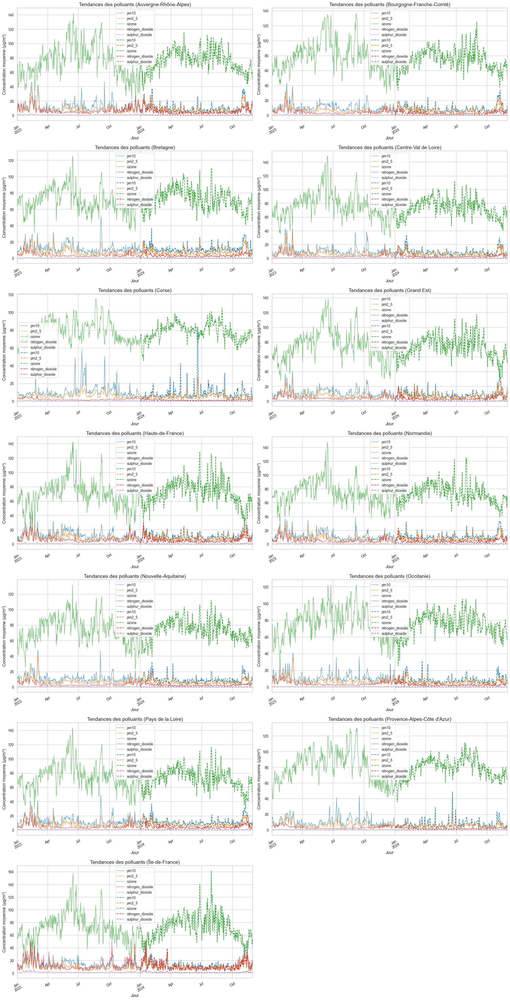

In [35]:
dataviz.time_series_regions(polluants, df_final)

#### 🌍 Tendances nationales reflétées régionalement

Les tendances des polluants atmosphériques observées à l’échelle nationale se retrouvent globalement dans les différentes régions de manière assez cohérente, bien que certaines particularités régionales puissent être relevées. Ces différences sont souvent attribuées aux caractéristiques spécifiques des zones concernées, qu’il s’agisse de la densité de population, des activités économiques ou des conditions environnementales locales. Par conséquent, même si les dynamiques générales des polluants atmosphériques sont similaires, il existe des nuances importantes qui méritent d’être analysées.

---

🏙️ Île-de-France et Provence-Alpes-Côte d’Azur

Dans des régions comme **l’Île-de-France** et **Provence-Alpes-Côte d’Azur**, les niveaux de pollution atmosphérique figurent parmi les plus élevés du pays, avec une concentration particulièrement notable de **dioxyde d’azote (NO₂)**. Ces régions densément peuplées connaissent une intense activité économique et une circulation automobile omniprésente 🚗, qui constituent des sources majeures de pollution. De plus, la configuration géographique et urbaine de ces zones peut parfois accentuer le phénomène d’accumulation des polluants. Ces niveaux élevés s’expliquent également par une concentration importante d’industries 🏭 et une forte consommation énergétique ⚡, caractéristiques des grandes zones métropolitaines.

 🌾 Bretagne et Corse

À l’inverse, des régions comme **la Bretagne** et **la Corse** présentent des niveaux de pollution bien plus faibles en comparaison du reste du territoire. Ces faibles concentrations peuvent être attribuées à une faible densité de population 👥 et à des activités industrielles limitées. Ces régions bénéficient également de **conditions météorologiques favorables** 🌬️ à la dispersion des polluants, notamment grâce à la proximité de l’océan 🌊, qui favorise un renouvellement constant de l’air. De plus, les caractéristiques géographiques et la moindre pression humaine sur l’environnement dans ces zones contribuent à maintenir un air globalement plus pur 🌱.

---

 ☀️ Variations saisonnières

Les **variations saisonnières** des polluants atmosphériques, et en particulier les **pics d’ozone (O₃)**, sont une autre caractéristique notable des dynamiques régionales. Ces pics sont observés dans l’ensemble des régions françaises, mais leur intensité varie en fonction des conditions locales. En été 🌞, ces concentrations d’ozone atteignent leur maximum en raison de l’intensification des **réactions photochimiques**, favorisées par des températures élevées 🔥 et un rayonnement solaire important. Ces phénomènes sont souvent plus marqués dans les régions où les conditions météorologiques, telles que des vagues de chaleur prolongées, amplifient ces processus. Néanmoins, même dans les régions aux niveaux globaux de pollution plus faibles, ces pics saisonniers restent visibles, bien que leur impact soit moins prononcé que dans les zones fortement urbanisées 🏘️.


In [36]:
df1.head()

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
2800,2023-01-01,6,Auvergne-Rhône-Alpes,14.954166,7.858334,3.475000,65.125,0.837500,11.954083,71.024551,0.000000,964.791809,23.574928,3,2,1,3,1,3
2801,2023-01-02,6,Auvergne-Rhône-Alpes,14.316667,7.962500,5.904167,71.000,0.933333,10.583250,76.024849,0.550000,965.794250,15.330505,3,2,1,3,1,3
2802,2023-01-03,6,Auvergne-Rhône-Alpes,8.666667,6.525000,11.420834,53.750,0.729167,6.727000,87.053253,0.125000,971.449707,5.034335,2,2,1,2,1,2
2803,2023-01-04,6,Auvergne-Rhône-Alpes,15.504167,11.441667,17.929167,37.875,1.075000,5.220750,84.029167,0.000000,972.121399,4.557892,3,3,1,2,1,3
2804,2023-01-05,6,Auvergne-Rhône-Alpes,11.616666,9.070833,12.416667,44.375,0.725000,7.531167,89.476860,0.016667,968.975586,5.073804,2,2,1,2,1,2


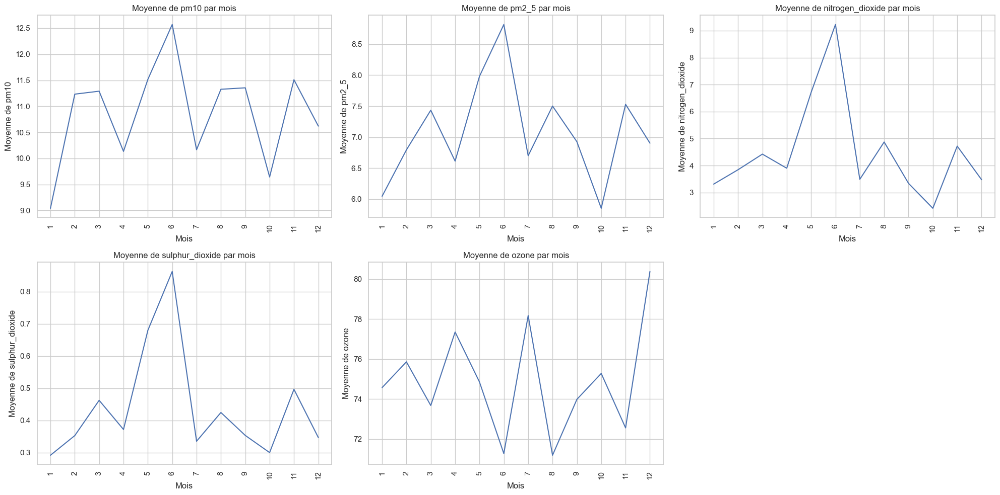

In [37]:
variables_air_month=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone","month"]
dataviz.plot_monthly_averages(df1,variables_air_month)

Les tendances mensuelles des principaux polluants atmosphériques révèlent des variations saisonnières significatives. Les particules fines **PM10** et **PM2.5** 🌫️ atteignent leur pic en **juin**, probablement en raison de l'intensification des activités humaines 🚜 ou de conditions météorologiques favorisant l'accumulation, tandis que leurs concentrations sont plus faibles en hiver ❄️. Le **dioxyde d’azote (NO₂)** 🚗 suit une tendance similaire, avec un maximum en **juin**, reflétant l'impact des émissions liées aux transports et à l’industrie 🏭. Le **dioxyde de soufre (SO₂)** 🔥 présente un pic en **mai**, probablement lié à des sources industrielles, avant de diminuer en été ☀️. L’**ozone (O₃)** 🌞, en tant que polluant secondaire, montre des niveaux plus élevés en été, en raison de réactions photochimiques amplifiées par le rayonnement solaire, mais affiche également une hausse notable en **décembre**, qui pourrait être associée à des conditions météorologiques spécifiques 🌬️. Ces variations mettent en lumière l’influence combinée des activités humaines, des phénomènes naturels 🌿 et des conditions climatiques sur la pollution atmosphérique.


In [38]:
variables_air_region=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone","region"]
df_air_region=df_final[variables_air_region].groupby(["region"]).mean()
df_air_region


,pm10,pm2_5,nitrogen_dioxide,sulphur_dioxide,ozone
region,,,,,
Auvergne-Rhône-Alpes,11.391398,8.019738,6.163274,0.549964,75.628952
Bourgogne-Franche-Comté,9.689458,6.438536,3.534101,0.337881,76.773442
Bretagne,11.905880,7.311768,3.597988,0.318262,71.608891
Centre-Val de Loire,9.917185,6.694089,3.169827,0.282143,74.808233
Corse,9.848196,5.443572,1.727952,0.332905,78.523585
Grand Est,10.403630,7.027137,4.012548,0.412583,74.597988
Hauts-de-France,12.268559,8.227059,6.272761,0.555869,70.917417
Normandie,11.407137,7.601459,4.785083,0.499726,73.473682
Nouvelle-Aquitaine,10.411905,6.652667,3.004595,0.309143,73.582500


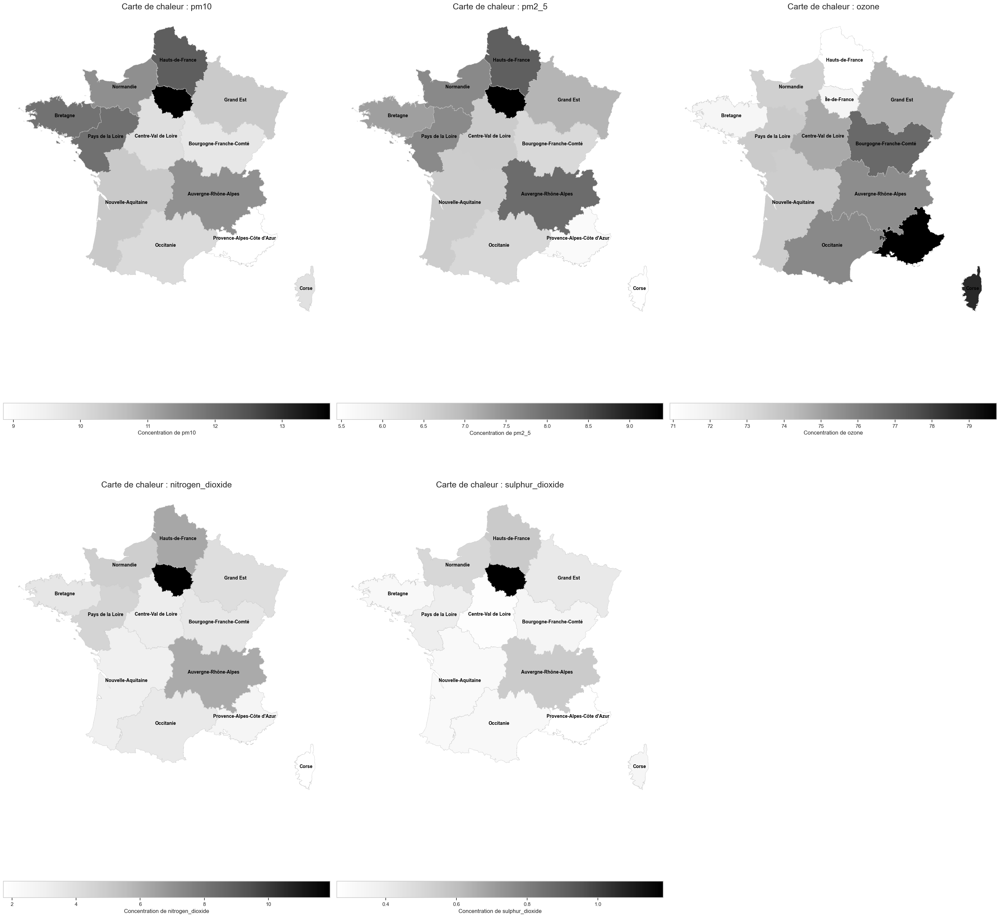

In [39]:
df_air_region["LIBELLE_REGION"] = df_air_region.index
gd=france.merge(df_air_region, on="LIBELLE_REGION",how="inner")
gd=gd.to_crs(3857)
polluants = ['pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']
dataviz.plot_pollutants(gd,polluants)

Les cartes choroplèthes confirment et complètent les analyses précédentes des tendances des polluants atmosphériques, en mettant en évidence des disparités régionales cohérentes avec les observations saisonnières et les sources de pollution identifiées. Par exemple, les niveaux élevés de **PM10** et **PM2.5** 🌫️ en **Île-de-France** et **Provence-Alpes-Côte d’Azur** correspondent aux concentrations observées en **juin**, période où l'intensité des activités humaines 🚗 et des conditions climatiques ☀️ favorisent l'accumulation. De même, les concentrations importantes de **dioxyde d'azote (NO₂)** 🌍 dans ces régions s'expliquent par la forte densité urbaine et le trafic automobile 🚘, confirmant leur rôle dominant dans les émissions de ce polluant. Les pics d'**ozone (O₃)** 🌞, particulièrement marqués dans le **Sud-Est**, s'alignent avec les variations saisonnières observées en **été**, où les réactions photochimiques sont amplifiées par le rayonnement solaire. Enfin, les faibles niveaux de **dioxyde de soufre (SO₂)** 🔥 en **Bretagne** et dans d'autres régions peu industrialisées 🏞️ illustrent l'impact limité des émissions industrielles dans ces zones, comme mentionné précédemment. Ces corrélations renforcent l'interprétation selon laquelle les variations régionales et saisonnières des polluants sont le reflet direct des activités humaines 🚜, des conditions climatiques 🌬️ et des spécificités géographiques locales 🌿.


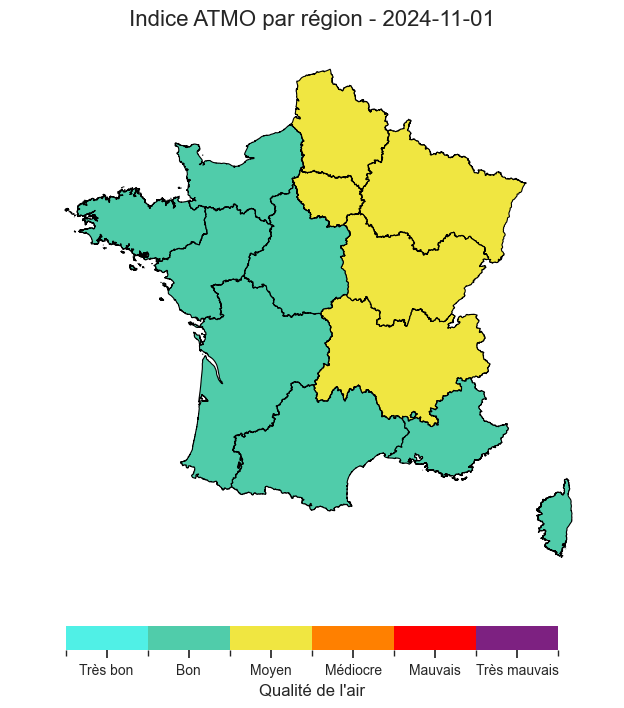

In [40]:
dataviz.plot_indice_atmo(df_final,france,"2024-11-01" )

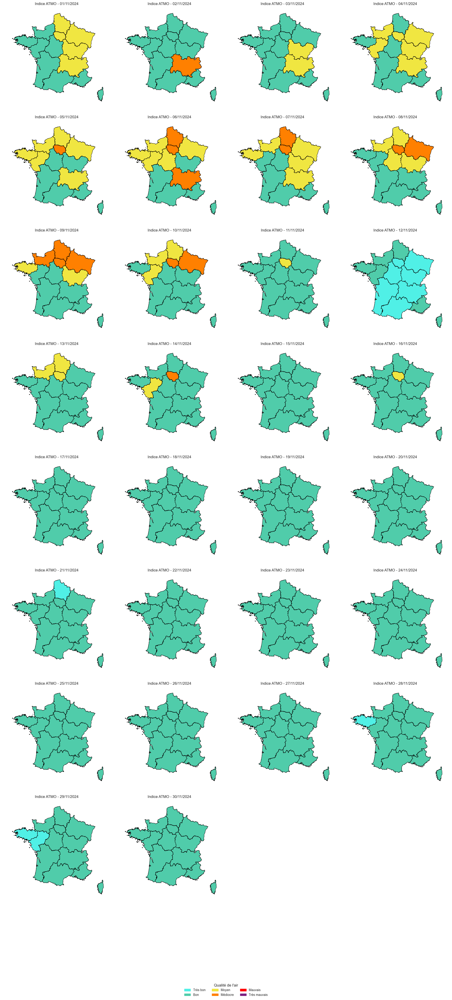

In [41]:
dataviz.plot_atmo_maps(df_final, france, start_date="2024-11-01", end_date="2024-11-30")

Les cartes de l’indice **ATMO** pour novembre 2024 montrent une qualité de l’air globalement **bonne à très bonne** 🟢  sur la majorité des régions françaises, avec quelques épisodes de pollution **moyenne à élevée** 🟡🔶 (jaune et orange), principalement entre le **8 et le 13 novembre**. Les régions les plus touchées, comme l’**Île-de-France**, le **Grand Est** et l’**Auvergne-Rhône-Alpes**, affichent des indices moyens à mauvais, probablement en raison de la densité urbaine 🏙️, du trafic automobile 🚗 et des conditions météorologiques favorisant l’accumulation des polluants, telles que les **inversions thermiques** 🌫️. En revanche, des régions comme la **Bretagne** et les zones côtières 🌊 maintiennent une qualité de l’air souvent **très bonne** , grâce à des conditions favorables à la dispersion des polluants. Vers la fin du mois, une **amélioration générale** 📈 est observée, avec une prédominance des indices verts 🟢 et bleu ciel, probablement due à des changements météorologiques, comme des vents 🌬️ ou des précipitations 🌧️.


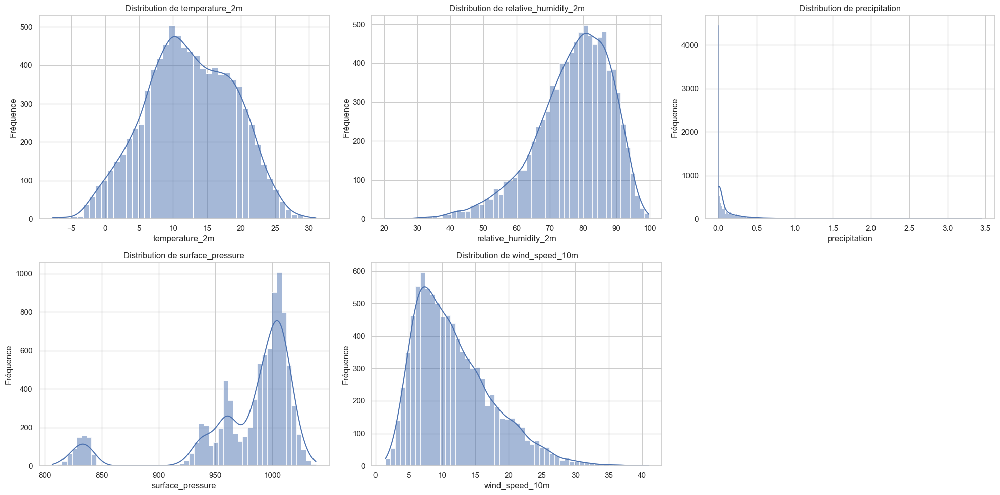

In [42]:
var_climat = ["temperature_2m", "relative_humidity_2m", 
              "precipitation", "surface_pressure", "wind_speed_10m"]

dataviz.plot_climatic_histograms(
    df=df_final, 
    var_climat=var_climat, 
    n_cols=3, 
    width=20, 
    height_per_row=5)

Les distributions des variables météorologiques montrent des caractéristiques climatiques typiques d’un climat tempéré, avec des **températures** majoritairement concentrées entre **10 et 15°C** et des valeurs extrêmes rares (entre **-5°C** et **30°C**). L’**humidité relative** est principalement élevée, autour de **80-90%**, indiquant des conditions souvent humides ou nuageuses 🌫️. Les **précipitations** présentent une forte asymétrie, avec une majorité d’observations proches de **0 mm**, reflétant des périodes généralement sèches et des événements de fortes pluies peu fréquents 🌧️. La **pression de surface** montre deux régimes principaux, autour de **850 hPa** (altitude ou dépressions) et **1000 hPa** (hautes pressions ou beau temps 🌤️). Enfin, la **vitesse du vent** est principalement concentrée entre **5 et 15 m/s**, avec des vents modérés dominants 🌬️, bien que des vents forts (>20 m/s) soient observés ponctuellement, probablement lors de tempêtes ou d’événements extrêmes. Ces distributions suggèrent des **conditions climatiques globalement stables**, avec des événements extrêmes rares mais significatifs.


Text(0.5, 1.0, 'Matrice de Corrélation')

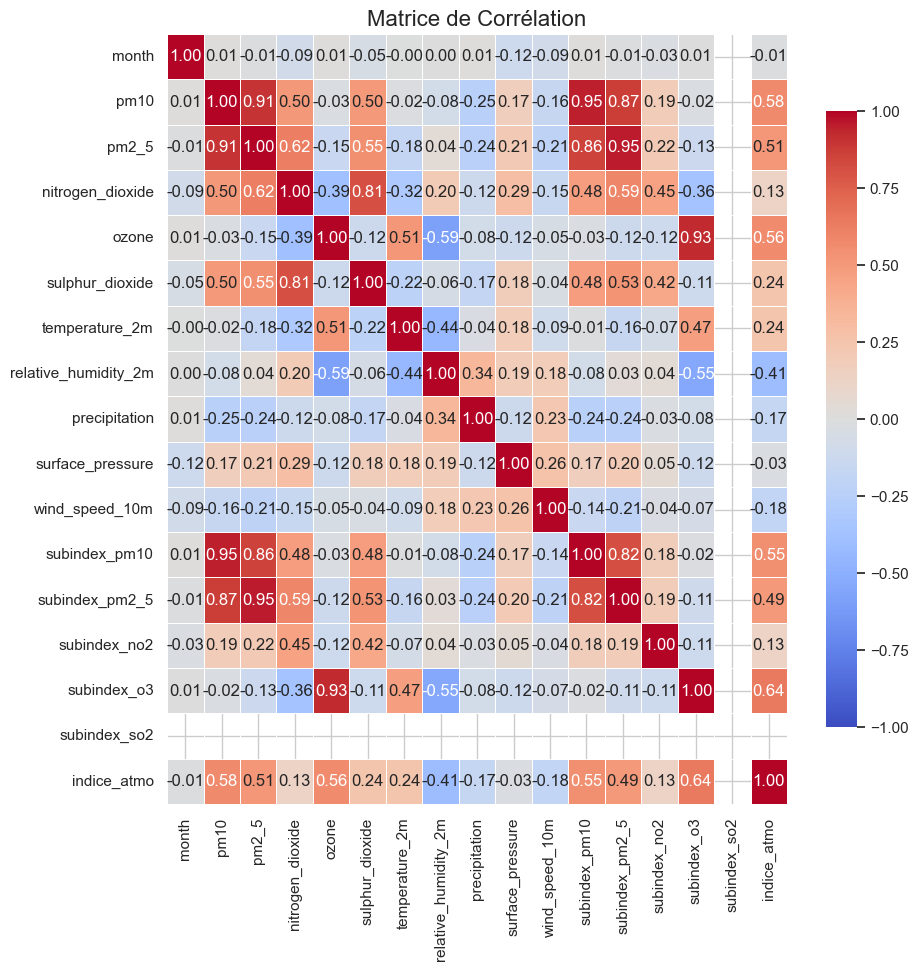

In [43]:
import numpy as np
corr_matrix = df_final.select_dtypes(include=[np.number]).corr()
plt.figure(figsize=(10, 10))  # Taille de la figure
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, 
            linewidths=0.5, fmt='.2f', cbar_kws={'shrink': 0.8})

# Titre
plt.title('Matrice de Corrélation', fontsize=16)

La matrice de corrélation permet d’identifier les **relations linéaires** entre différentes variables. Notamment, il existe une **bonne corrélation positive** entre la **précipitation** et la concentration des gaz polluants 🌧️, puisque les précipitations contribuent à **nettoyer l’air** en lavant les polluants atmosphériques. Les gouttes de pluie capturent les particules et les gaz polluants, les déposant au sol. À l’inverse, une **corrélation négative** est observée entre la **température** 🌡️ et les différents polluants. En effet, le froid limite la dispersion verticale des polluants, entraînant une accumulation de ces derniers près du sol. 

Par ailleurs, plusieurs gaz sont **fortement corrélés** entre eux, comme **NO₂/SO₂** et **PM2.5/PM10**, car ils proviennent souvent des **mêmes sources** (trafic routier, industries 🏭) ou des **mêmes réactions chimiques**. Ces corrélations soulignent les interactions complexes entre les variables climatiques et les polluants atmosphériques, aidant à mieux comprendre les mécanismes sous-jacents de la pollution de l’air.


## 🌐 Modélisation

Après une description approfondie de la base de données en général et de la qualité de l'air en particulier, nous allons procéder à une tentative de modélisation des chroniques des variables de qualité de l'air en Ile de France. Ce choix géographique se justifie par le fait qu'elle apparit comme la région la plus peuplée de France et aussi celle qui présente les résultats les plus inquietants en terme de qualité de l'air.


Cette partie se fera en **quatre étapes** :  
- **📈 Modélisation des chroniques de qualité de l'air individuellement** grâce à un modèle de type **ARIMA** (ARIMA).  
- **🔗 Modélisation groupée des chroniques de qualité de l'air** en utilisant un modèle **VAR** (VAR1).  
- **🌦️ Modélisation groupée des chroniques de qualité de l'air** en utilisant un modèle **VAR intégrant les variables climatiques** (VAR2).  
- **🧪 Une évaluation des prévisions** faites par les trois modèles.  
- **🎉 Et une partie supplémentaire** où nous testerons un autre modèle.  



In [44]:
!pip install scikit-learn
!pip install statsmodels


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: C:\Users\nouts\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [45]:
df_idf = df_final[df_final["region"]=="Île-de-France"]
df_idf

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
9100,2023-01-01,5,Île-de-France,15.383334,9.358334,7.616667,55.000000,1.375000,13.652084,71.534920,0.079167,1009.788025,19.753124,3,2,1,3,1,3
9101,2023-01-02,5,Île-de-France,9.312500,6.445833,16.291666,57.625000,1.337500,10.062500,89.010780,0.404167,1015.033752,13.947431,2,2,1,3,1,3
9102,2023-01-03,5,Île-de-France,11.849999,7.379167,13.200000,54.125000,1.141667,7.752083,91.482140,0.062500,1022.744385,16.570414,2,2,1,3,1,3
9103,2023-01-04,5,Île-de-France,5.800000,3.862500,7.841667,64.000000,1.187500,11.695834,89.660561,0.112500,1019.289001,25.613174,1,1,1,3,1,3
9104,2023-01-05,5,Île-de-France,6.237500,4.679166,14.345833,60.666667,1.300000,12.356251,88.560097,0.020833,1019.476074,15.305164,2,1,1,3,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9795,2024-11-26,6,Île-de-France,12.691667,8.512500,13.220833,57.375000,0.916667,8.658334,88.946800,0.108333,1014.152649,11.292778,2,2,1,3,1,3
9796,2024-11-27,6,Île-de-France,7.362500,5.725000,11.762500,62.750000,0.775000,10.439584,91.109230,0.254167,1012.352295,17.599253,2,2,1,3,1,3
9797,2024-11-28,6,Île-de-France,14.870833,12.295834,19.445833,45.000000,1.537500,6.358334,84.380318,0.004167,1022.028015,6.830119,3,3,1,2,1,3
9798,2024-11-29,6,Île-de-France,14.041667,11.537499,12.087501,53.250000,0.920833,3.558333,85.608681,0.000000,1023.345276,9.613878,3,3,1,2,1,3


In [46]:
df_idf.shape

(700, 19)

### 📈 Modélisation ARIMA

L’objectif de cette étape est de modéliser **individuellement** les chroniques de qualité de l’air en utilisant un modèle de type **ARIMA** (Auto-Regressive Integrated Moving Average). 
 **Pourquoi ARIMA ?**
- L’ARIMA est particulièrement adapté pour capturer les **dynamiques temporelles** des séries chronologiques.
- Il permet de modéliser les variations saisonnières et les tendances sous-jacentes dans les données de pollution atmosphérique.

 **Étapes clés :**
1. **Analyse exploratoire :**  
   - Identification des composantes principales des chroniques : tendance, saisonnalité (Déjà exploré dans la deuxième partie). 
   - Tests de stationnarité (ex. : **Dickey-Fuller Augmenté**) pour évaluer la nécessité d’un différencier les données.  
2. **Paramétrage du modèle :**  
   - Sélection des paramètres **(p, d, q)** grâce à des critères comme **AIC** ou **BIC**.
   
        Le q est déterminé par le point où l’ACF devient insignifiante (chute sous les lignes de confiance).
        Le p est déterminé par le point où la PACF devient insignifiante (chute sous les lignes de confiance).
        Ces analyses permettent de choisir les ordres p et q pour le modèle ARIMA en fonction des propriétés de la série chronologique.
3. **Ajustement du modèle :**  
   - Entraînement du modèle ARIMA pour chaque chronique en fonction des caractéristiques propres à chaque polluant.
4. **Validation et prévisions :**  
   - Comparaison des prévisions aux valeurs observées pour évaluer la précision.  
   - Calcul d’indicateurs comme RMSE.


#### ARIMA pm10

La série est stationnaire.


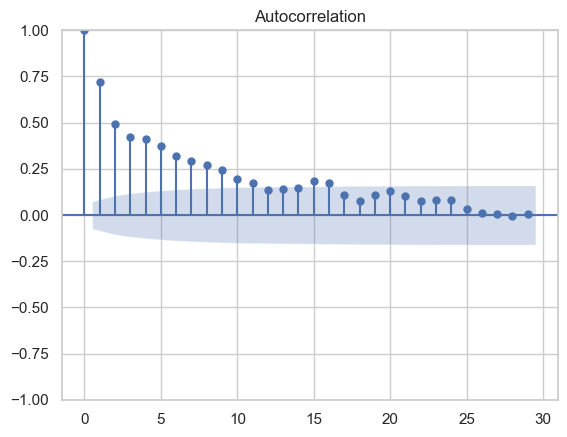

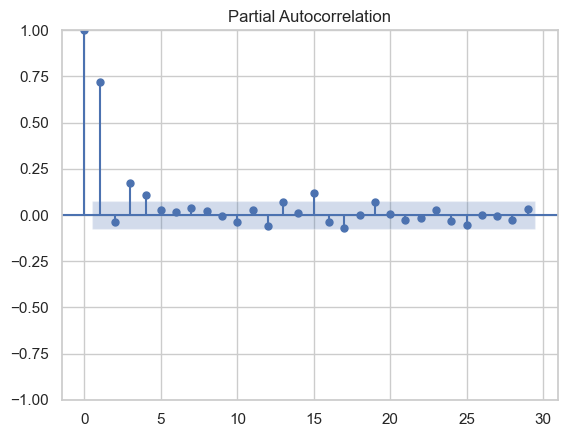

In [47]:
# Test de la stationarité
from scripts import modele
modele.stationarity_acf(df_idf,"pm10")

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, 

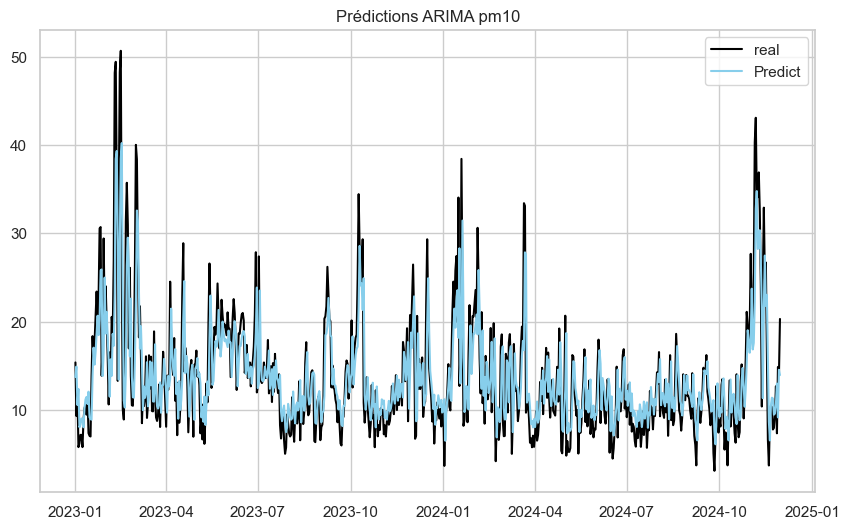

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


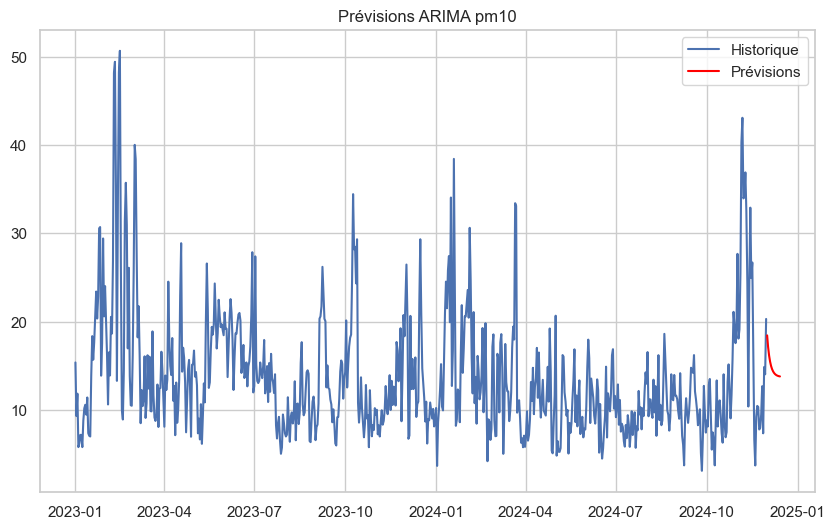

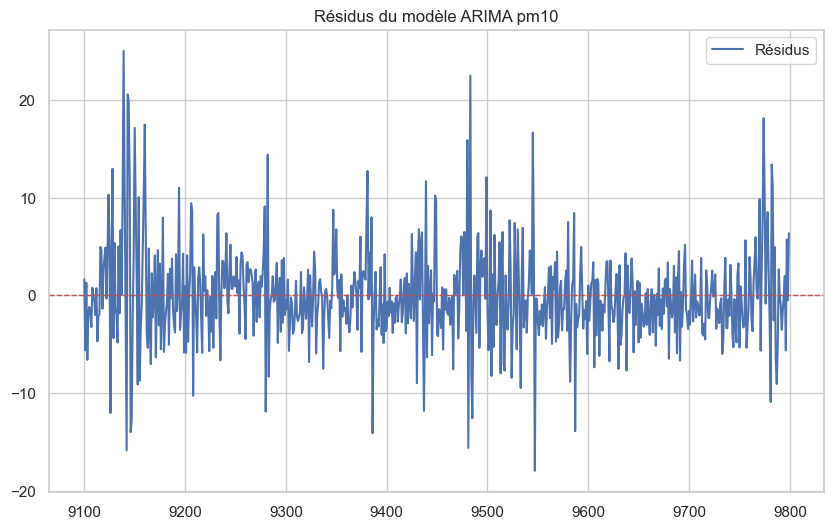

In [48]:
model_fit_pm10 = modele.fit_arima(df_idf,"pm10",1,0,0)
modele.prediction_arima(df_idf,"pm10",model_fit_pm10)
forecast_pm10 = modele.prevision_arima(df_idf,"pm10",model_fit_pm10)
modele.residus(df_idf,"pm10",model_fit_pm10)

### ARIMA pm2_5

La série est stationnaire.


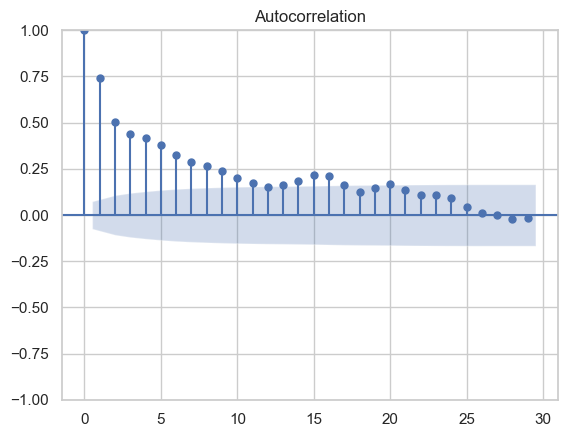

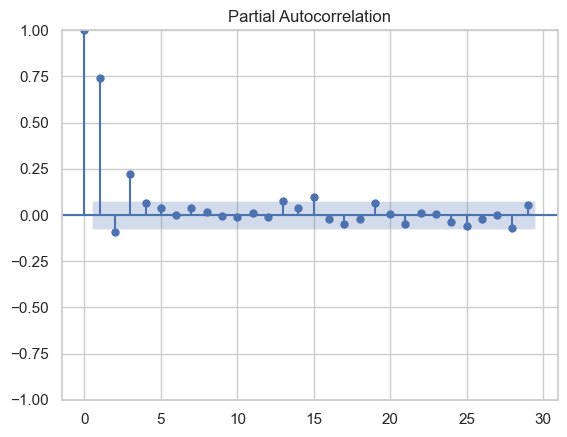

In [49]:
# Test de la stationarité
from scripts import modele
modele.stationarity_acf(df_idf,"pm2_5")

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, 

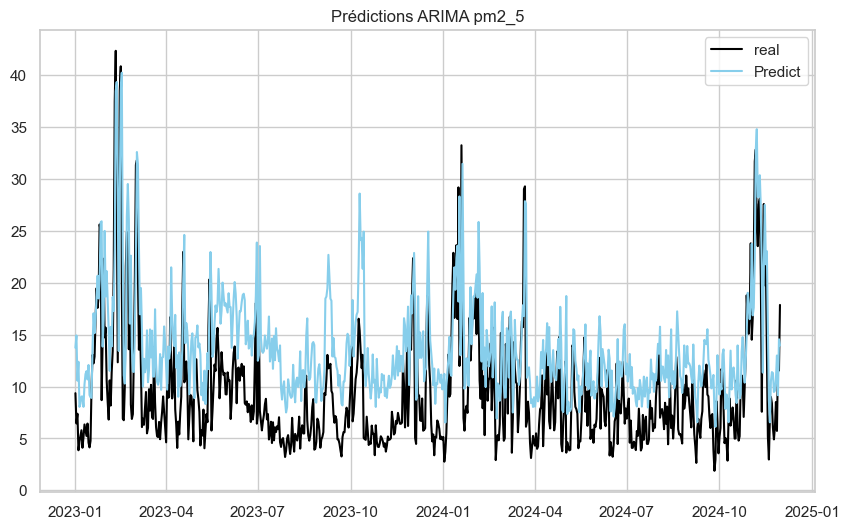

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


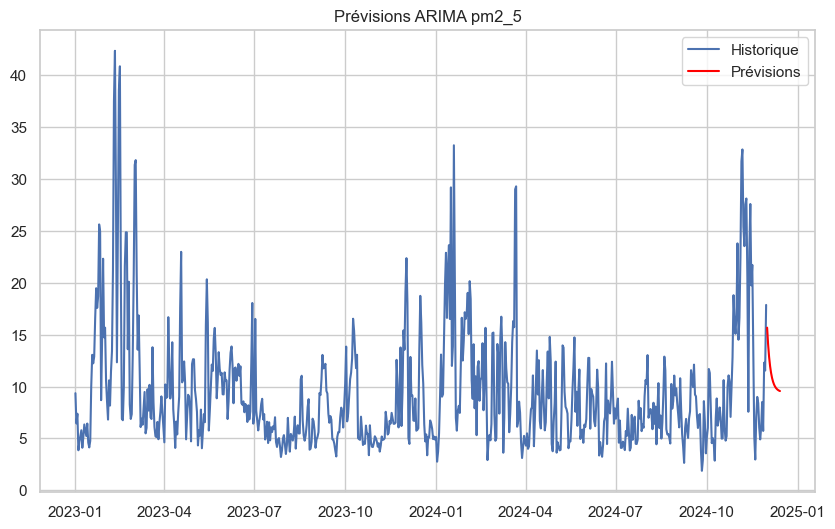

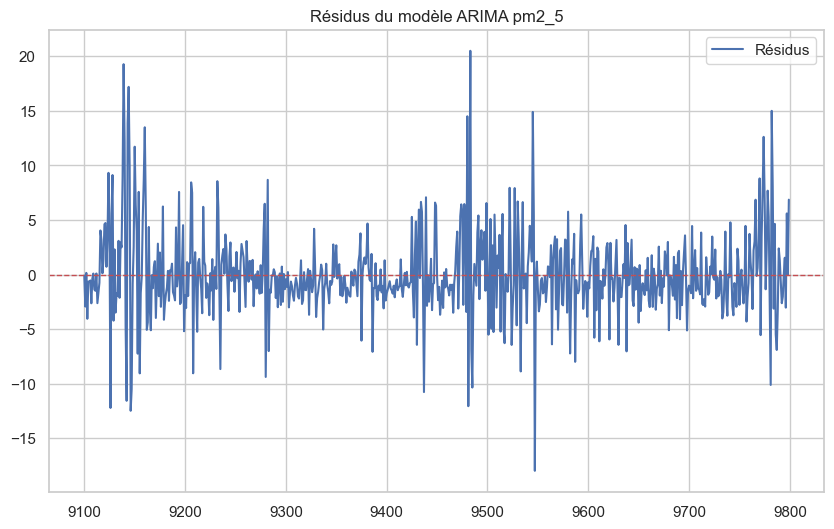

In [50]:
model_fit_pm2_5 = modele.fit_arima(df_idf,"pm2_5",1,0,0)
modele.prediction_arima(df_idf,"pm2_5",model_fit_pm10)
forecast_pm2_5 = modele.prevision_arima(df_idf,"pm2_5",model_fit_pm2_5)
modele.residus(df_idf,"pm2_5",model_fit_pm2_5)

### ARIMA ozone

La série n'est pas stationnaire.


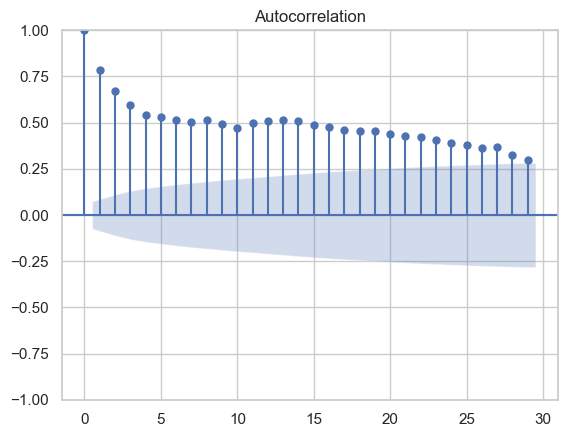

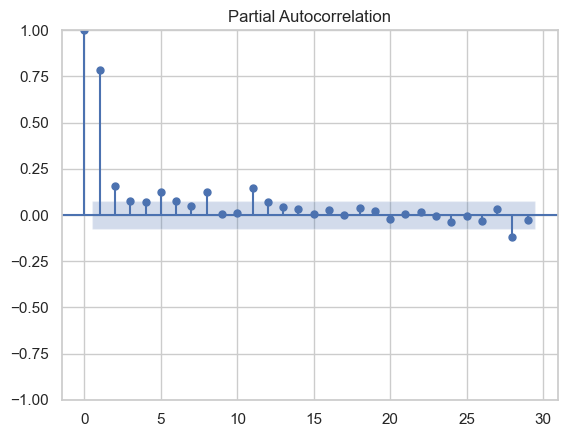

In [51]:
# Test de la stationarité
from scripts import modele
modele.stationarity_acf(df_idf,"ozone")

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, 

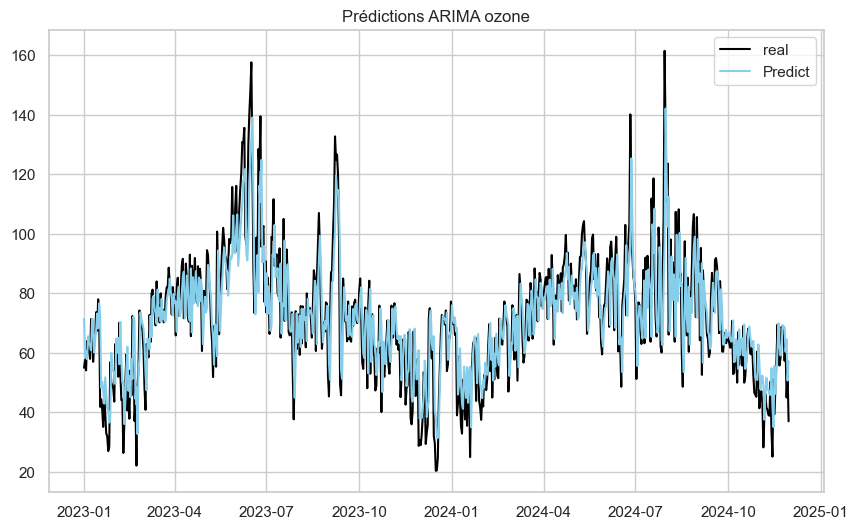

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


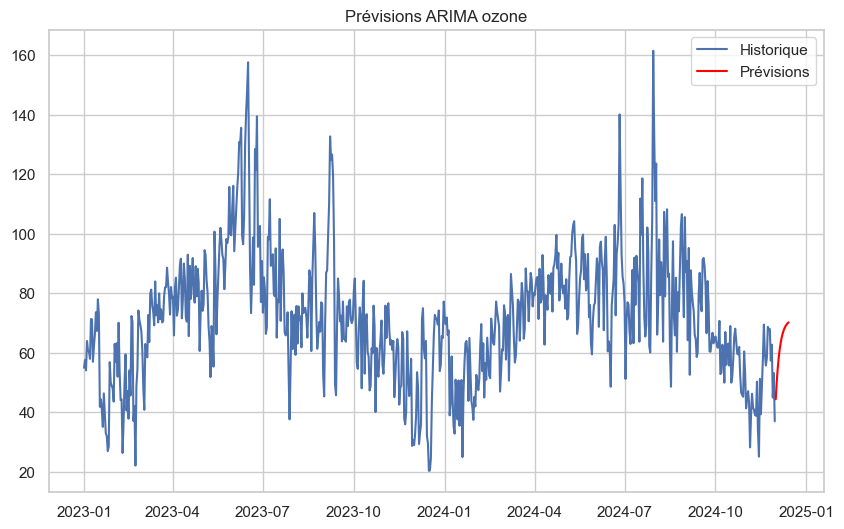

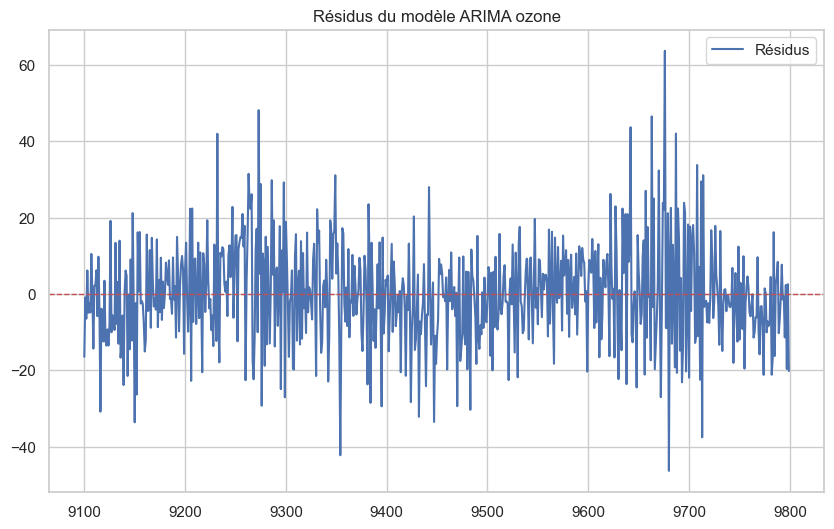

In [52]:
model_fit_ozone = modele.fit_arima(df_idf,"ozone",1,0,0)
modele.prediction_arima(df_idf,"ozone",model_fit_ozone)
forecast_ozone = modele.prevision_arima(df_idf,"ozone",model_fit_ozone)
modele.residus(df_idf,"ozone",model_fit_ozone)

### ARIMA nitrogen_dioxide

La série est stationnaire.


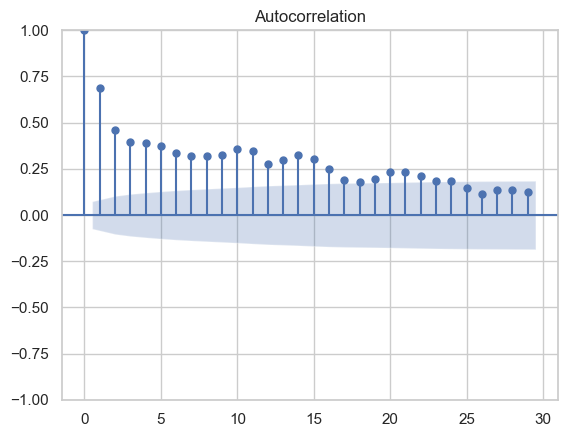

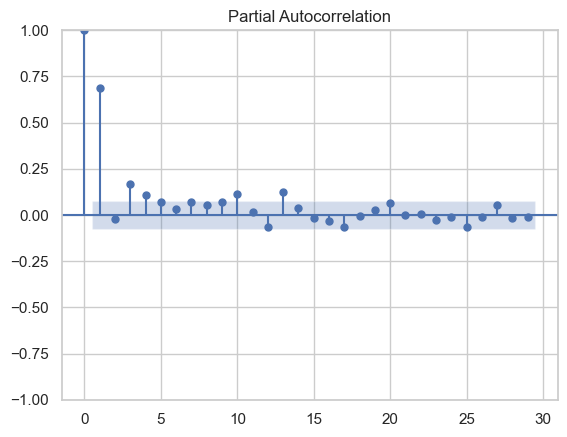

In [53]:
# Test de la stationarité
from scripts import modele
modele.stationarity_acf(df_idf,"nitrogen_dioxide")

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, 

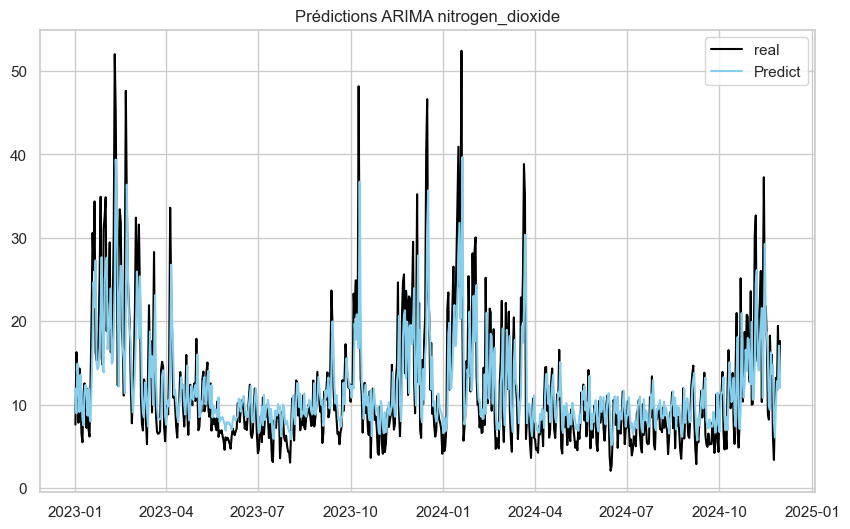

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


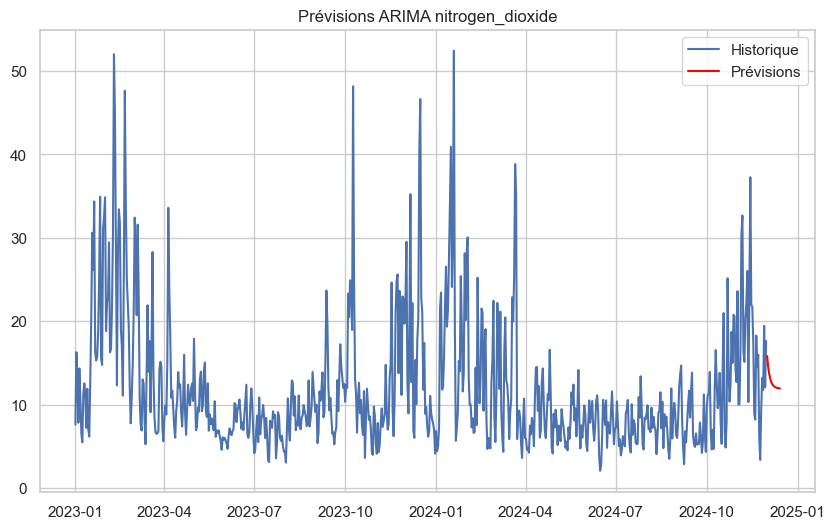

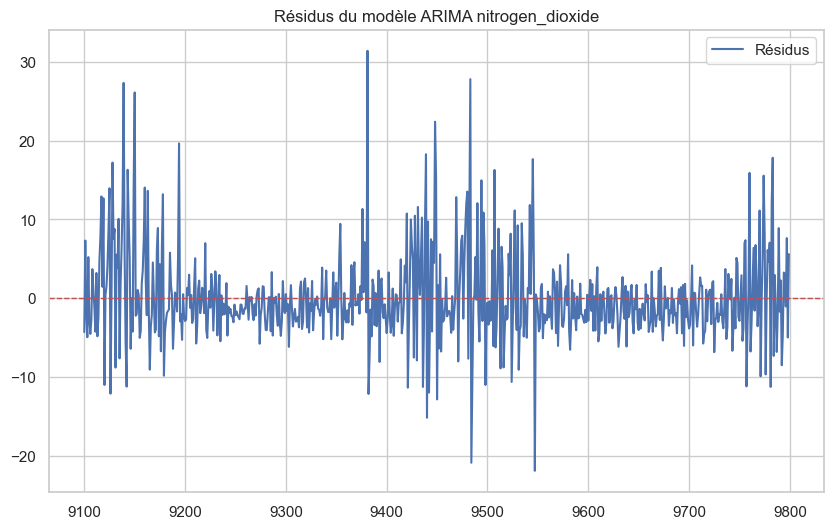

In [54]:
model_fit_nitrogen_dioxide = modele.fit_arima(df_idf,"nitrogen_dioxide",1,0,0)
modele.prediction_arima(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)
forecast_nitrogen_dioxide = modele.prevision_arima(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)
modele.residus(df_idf,"nitrogen_dioxide",model_fit_nitrogen_dioxide)

### ARIMA sulphur_dioxide

La série est stationnaire.


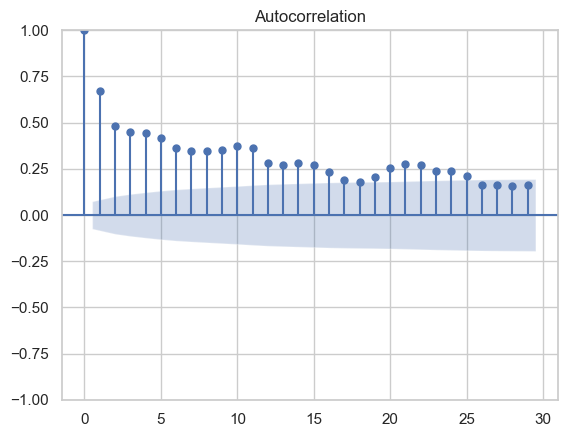

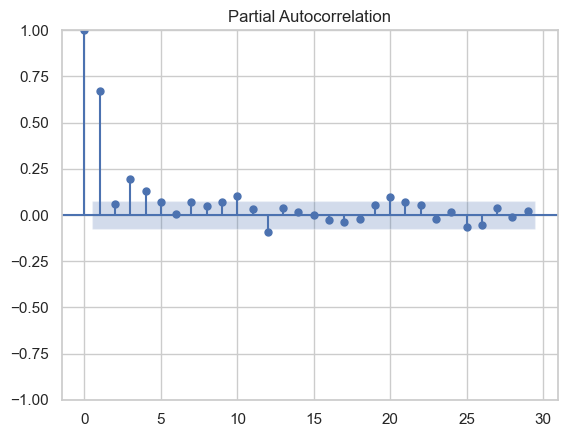

In [55]:
# Test de la stationarité
from scripts import modele
modele.stationarity_acf(df_idf,"sulphur_dioxide")

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, 

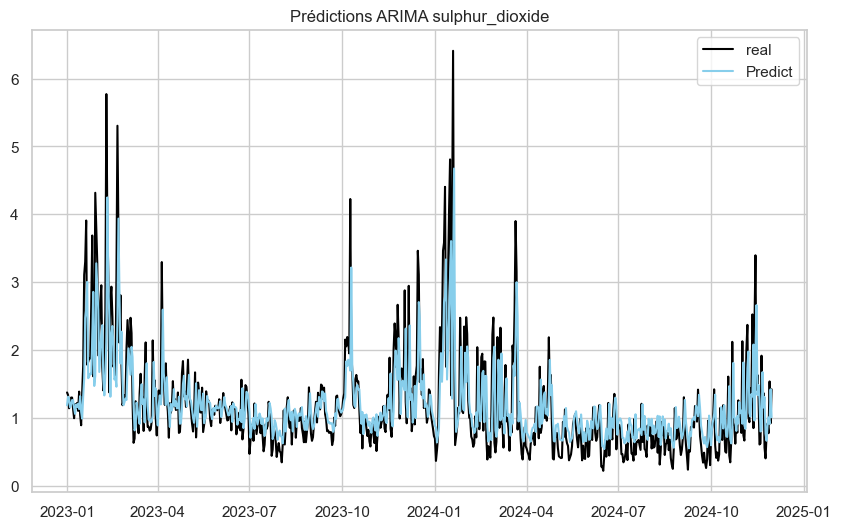

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


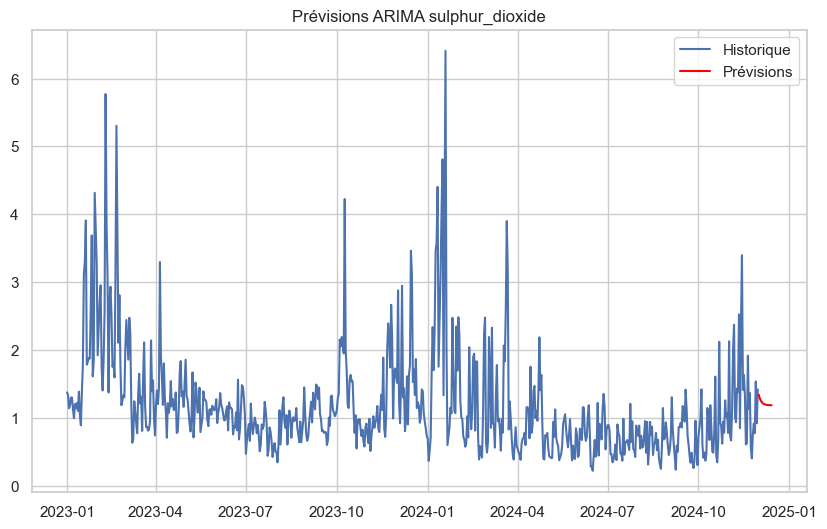

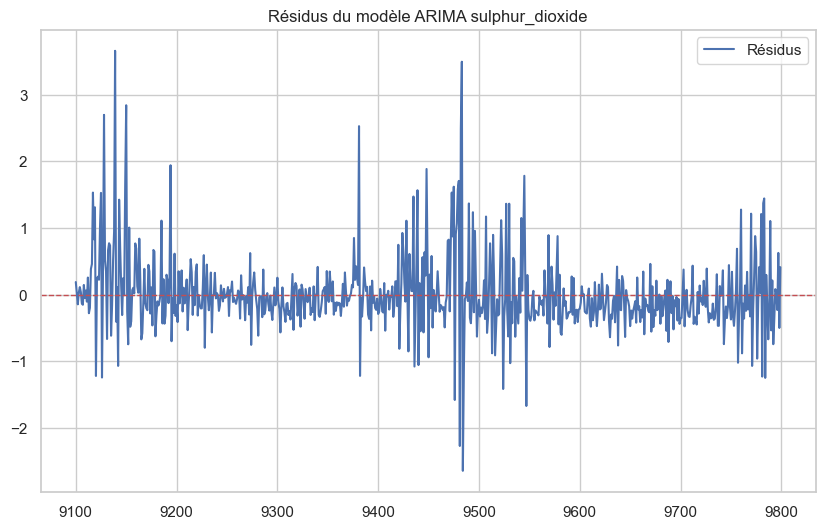

In [56]:
model_fit_sulphur_dioxide = modele.fit_arima(df_idf,"sulphur_dioxide",1,0,0)
modele.prediction_arima(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)
forecast_sulphur_dioxide = modele.prevision_arima(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)
modele.residus(df_idf,"sulphur_dioxide",model_fit_sulphur_dioxide)

In [57]:
forecast_steps = 14
forecast_arima = pd.DataFrame({"pm10" : list(forecast_pm10),
                               "pm2_5" : list(forecast_pm2_5),
                               "ozone" : list(forecast_ozone),
                               "nitrogen_dioxide" : list(forecast_nitrogen_dioxide),
                               "sulphur_dioxide" : list(forecast_sulphur_dioxide)},index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:])

forecast_arima

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,18.450265,15.669705,44.410037,15.837204,1.342927
2024-12-02,17.117725,14.050125,50.225129,14.603978,1.290895
2024-12-03,16.162074,12.851639,54.788572,13.759201,1.256146
2024-12-04,15.476715,11.964761,58.369774,13.180518,1.232937
2024-12-05,14.985200,11.308474,61.180153,12.784112,1.217437
2024-12-06,14.632703,10.822822,63.385622,12.512569,1.207086
2024-12-07,14.379905,10.463441,65.116383,12.326559,1.200172
2024-12-08,14.198607,10.197500,66.474613,12.199139,1.195554
2024-12-09,14.068586,10.000704,67.540496,12.111855,1.192471
2024-12-10,13.975340,9.855075,68.376956,12.052064,1.190411


🌟 On remarque des résultats précédents que les modèles **ARIMA** "fit" **plutôt bien** aux données et permettent ainsi de rendre compte du **processus générateur** de nos chroniques.  
📊 De plus, le **graphe des résidus** indique que ceux-ci semblent être de **moyenne nulle**, ce qui est un **indicateur de qualité** du modèle.  

📉 En outre, hormis la variable **ozone** 🌞, les modèles ARIMA prévoient une **baisse** dans les valeurs des variables de qualité de l’air dans les **2 semaines à venir** (01-12-24 → 14-12-24).


In [58]:
from sklearn.preprocessing import StandardScaler

### 🔗 Modélisation VAR Simple

La modélisation **VAR (Vector Auto-Regressive)** simple permet de modéliser les chroniques de qualité de l'air en **prenant en compte simultanément** les interactions entre les différentes variables.

#### **Étapes de la modélisation :**
1. **Préparation des données :**
   - Vérification de la stationnarité des chroniques à l’aide de tests comme **ADF** (Augmented Dickey-Fuller).
   - Transformation des chroniques si nécessaire (différenciation, normalisation).

2. **Ajustement du modèle :**
   - Estimation des paramètres du modèle en considérant toutes les variables simultanément.
   - Choix du **nombre de lags** optimal à l’aide de critères comme **AIC**, **BIC** 

3. **Validation :**
   - Vérification des résidus pour s’assurer qu’ils sont de moyenne nulle et non autocorrélés.
   - Utilisation de métriques comme **RMSE** ou **MAE** pour évaluer les performances.

4. **Prédictions :**
   - Prévision des valeurs futures pour chaque variable en tenant compte des interactions entre elles.



La **modélisation VAR** va permettre de prendre en compte les **potentielles interactions** entre les variables de qualité de l’air, dans l’espoir d’**améliorer la qualité de prévision** du modèle.  

Pour éviter de donner une **trop grande importance** à certaines variables dans le modèle et éliminer le **biais d’échelle**, nous allons **standardiser** au préalable les données de la base. 📏


In [59]:
scaler1 = StandardScaler()
df_idf_var1 =  df_idf[['day','pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide']].set_index("day")
df_idf_var1 = pd.DataFrame(scaler1.fit_transform(df_idf_var1), columns=df_idf_var1.columns, index=df_idf_var1.index)
train1 = df_idf_var1

In [60]:
df_idf_var1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
day,,,,,
2023-01-01,0.240121,-0.008347,-0.787812,-0.556502,0.247064
2023-01-02,-0.630537,-0.514383,-0.663928,0.564945,0.198297
2023-01-03,-0.266617,-0.352220,-0.829107,0.165275,-0.056377
2023-01-04,-1.134287,-0.963228,-0.363065,-0.527416,0.003228
2023-01-05,-1.071543,-0.821335,-0.520379,0.313400,0.149530
...,...,...,...,...,...
2024-11-26,-0.145908,-0.155307,-0.675726,0.167968,-0.348980
2024-11-27,-0.910199,-0.639625,-0.422058,-0.020556,-0.533212
2024-11-28,0.166620,0.502033,-1.259753,0.972695,0.458389


In [61]:
#selection ordre du modèle
from statsmodels.tsa.api import VAR

# Initialisation du modèle
model1 = VAR(train1)

# Sélection de l'ordre optimal
selected_order1 = model1.select_order(maxlags=15)  # Ajustez maxlags en fonction des données
print(selected_order1.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -5.123      -5.090    0.005957      -5.110
1       -8.223     -8.024*   0.0002685      -8.146
2       -8.306      -7.943   0.0002470     -8.165*
3      -8.352*      -7.823  0.0002360*      -8.147
4       -8.341      -7.647   0.0002385      -8.073
5       -8.334      -7.474   0.0002403      -8.001
6       -8.295      -7.270   0.0002498      -7.899
7       -8.256      -7.066   0.0002597      -7.796
8       -8.232      -6.877   0.0002662      -7.708
9       -8.193      -6.672   0.0002768      -7.605
10      -8.177      -6.491   0.0002815      -7.524
11      -8.154      -6.302   0.0002882      -7.437
12      -8.134      -6.117   0.0002941      -7.354
13      -8.129      -5.947   0.0002958      -7.284
14      -8.102      -5.755   0.0003040      -7.194
15      -8.088      -5.575   0.0003087      -7.115
-------------------------------

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [62]:
optimal_lag1 = selected_order1.aic #critère AIC
optimal_lag1

np.int64(3)

In [63]:
# Fitting the VAR model with the optimal lag
#optimal_lag=1
var_model1 = model1.fit(optimal_lag1)

# Summary of the VAR model
var_model1_summary = var_model1.summary()
var_model1_summary

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 29, Dec, 2024
Time:                     17:33:15
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -7.88337
Nobs:                     697.000    HQIC:                  -8.20347
Log likelihood:          -1935.77    FPE:                0.000223701
AIC:                     -8.40524    Det(Omega_mle):     0.000199702
--------------------------------------------------------------------
Results for equation pm10
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                       0.001864         0.025496            0.073           0.942
L1.pm10                     0.435205         0.121308            3.588           0.000
L1.pm2_5                    0.201170 

In [64]:
print(train1.values.shape)  # Nombre de lignes et colonnes
print(var_model1.coefs.shape)  # Dimensions des coefficients

(700, 5)
(3, 5, 5)


In [65]:
# Prédictions
forecast_steps = 14
forecast1 = var_model1.forecast(y=train1.values, steps=forecast_steps)

# Conversion des prévisions en DataFrame
forecast_df1 = pd.DataFrame(forecast1, index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], columns=df_idf_var1.columns)
forecast_df1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,0.797805,1.268930,-1.335544,0.736502,0.387029
2024-12-02,0.318440,0.721949,-1.077018,0.450633,0.097407
2024-12-03,0.311892,0.653415,-0.926712,0.518988,0.244274
2024-12-04,0.399843,0.707070,-0.835038,0.588659,0.347290
2024-12-05,0.364340,0.640490,-0.732500,0.521741,0.293081
2024-12-06,0.297333,0.540153,-0.641741,0.443521,0.252071
2024-12-07,0.268282,0.481894,-0.569412,0.406228,0.248160
2024-12-08,0.253019,0.442385,-0.505124,0.374214,0.236639
2024-12-09,0.230394,0.398082,-0.447517,0.334878,0.215083
2024-12-10,0.206456,0.354513,-0.397256,0.298607,0.195925


Nous affichons par la suite quelques résultats pour la variable "pm10" . Le résultat est reproductible pour toutes les autres.

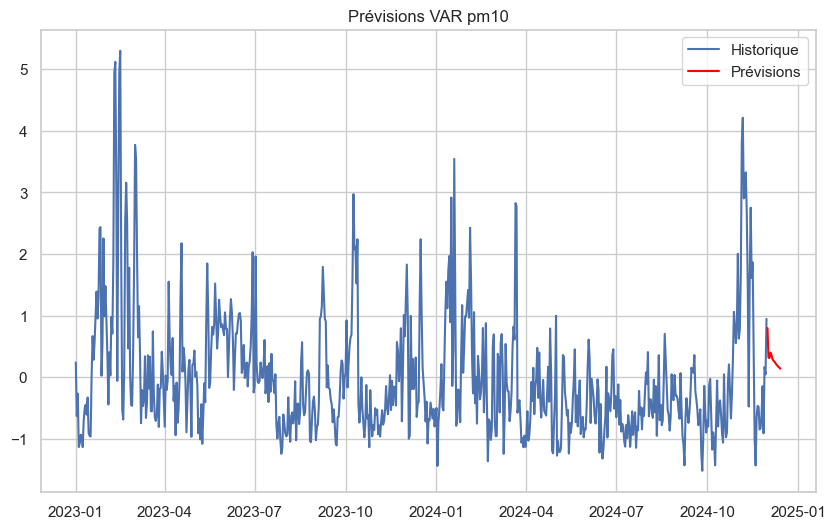

In [66]:
f=modele.prevision_var(df_idf_var1,"pm10",var_model1)

In [67]:
resid1 = var_model1.resid
print(resid1.describe())

               pm10         pm2_5         ozone  nitrogen_dioxide  \
count  6.970000e+02  6.970000e+02  6.970000e+02      6.970000e+02   
mean  -1.197830e-16  2.453004e-17 -2.179032e-16     -7.136010e-17   
std    6.658026e-01  6.384409e-01  6.058187e-01      7.018795e-01   
min   -3.055924e+00 -2.854347e+00 -2.275284e+00     -2.873264e+00   
25%   -3.773204e-01 -3.244857e-01 -3.870399e-01     -3.811657e-01   
50%   -4.788184e-02 -7.253485e-02 -2.223171e-02     -9.600571e-02   
75%    3.241964e-01  2.891281e-01  3.853250e-01      2.758329e-01   
max    3.478839e+00  3.281117e+00  3.173350e+00      4.291531e+00   

       sulphur_dioxide  
count     6.970000e+02  
mean      1.529145e-17  
std       7.136423e-01  
min      -3.295701e+00  
25%      -3.660132e-01  
50%      -8.640386e-02  
75%       2.406278e-01  
max       4.783312e+00  


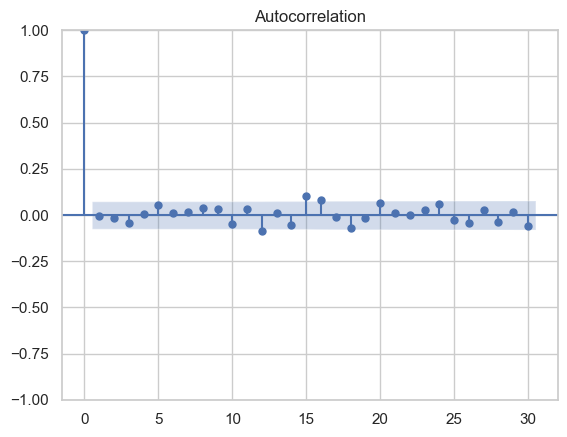

In [68]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(resid1["pm10"], lags=30)
plt.show()

Les résidus associés à chacune de nos variables semblent encore être de **moyenne nulle**, et de plus, le **graphe des autocorrélations** indique qu’ils se comportent comme un **bruit blanc**. Cela tend à conforter la **qualité** de notre modèle. 🎯


### 🌦️ Modélisation VAR avec Variables Climatiques

Cette étape consiste à modéliser les chroniques de qualité de l'air en utilisant un modèle **VAR (Vector Auto-Regressive)** enrichi avec des **variables climatiques** (température, précipitations, humidité, vitesse du vent, etc.). L’objectif est de capturer les **interactions dynamiques** entre les polluants atmosphériques et les facteurs météorologiques.

Le procédé est le même, à la seule différence que l'on rajoute des variables climatiques dans le but de voir si elle améliore les prévisions du modèle

---

In [69]:
scaler2 = StandardScaler()
df_idf_var2 =  df_idf[['day','pm10', 'pm2_5', "ozone" ,'nitrogen_dioxide', 'sulphur_dioxide',"temperature_2m", "relative_humidity_2m", "precipitation", "surface_pressure", "wind_speed_10m"]].set_index("day")
df_idf_var2 = pd.DataFrame(scaler2.fit_transform(df_idf_var2), columns=df_idf_var2.columns, index=df_idf_var2.index)
train2 = df_idf_var2

In [70]:
df_idf_var2

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
day,,,,,,,,,,
2023-01-01,0.240121,-0.008347,-0.787812,-0.556502,0.247064,0.096452,-0.674185,-0.176358,-0.053938,1.133370
2023-01-02,-0.630537,-0.514383,-0.663928,0.564945,0.198297,-0.486798,1.110819,1.402707,0.491810,0.116135
2023-01-03,-0.266617,-0.352220,-0.829107,0.165275,-0.056377,-0.862204,1.363247,-0.257336,1.293998,0.575717
2023-01-04,-1.134287,-0.963228,-0.363065,-0.527416,0.003228,-0.221408,1.177189,-0.014402,0.934511,2.160129
2023-01-05,-1.071543,-0.821335,-0.520379,0.313400,0.149530,-0.114100,1.064786,-0.459780,0.953974,0.354028
...,...,...,...,...,...,...,...,...,...,...
2024-11-26,-0.145908,-0.155307,-0.675726,0.167968,-0.348980,-0.714953,1.104284,-0.034647,0.400143,-0.348995
2024-11-27,-0.910199,-0.639625,-0.422058,-0.020556,-0.533212,-0.425528,1.325158,0.673908,0.212840,0.755983
2024-11-28,0.166620,0.502033,-1.259753,0.972695,0.458389,-1.088666,0.637859,-0.540757,1.219469,-1.130912


In [71]:
#selection ordre du modèle
from statsmodels.tsa.api import VAR

# Initialisation du modèle
model2 = VAR(train2)

# Sélection de l'ordre optimal
selected_order2 = model2.select_order(maxlags=15)  # Ajustez maxlags en fonction des données
print(selected_order2.summary())

C:\Users\nouts\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -8.373      -8.307   0.0002310      -8.348
1       -15.22     -14.49*   2.455e-07      -14.94
2      -15.50*      -14.11  1.854e-07*     -14.96*
3       -15.47      -13.42   1.910e-07      -14.68
4       -15.35      -12.64   2.154e-07      -14.30
5       -15.26      -11.89   2.358e-07      -13.96
6       -15.14      -11.11   2.675e-07      -13.58
7       -15.07      -10.37   2.882e-07      -13.25
8       -14.93      -9.570   3.330e-07      -12.85
9       -14.78      -8.762   3.876e-07      -12.45
10      -14.69      -8.015   4.247e-07      -12.11
11      -14.59      -7.249   4.749e-07      -11.75
12      -14.50      -6.496   5.254e-07      -11.40
13      -14.53      -5.867   5.140e-07      -11.18
14      -14.42      -5.093   5.818e-07      -10.81
15      -14.36      -4.378   6.226e-07      -10.50
-------------------------------

In [72]:
optimal_lag2 = selected_order2.aic
optimal_lag2

np.int64(2)

In [73]:
# Fitting the VAR model with the optimal lag
#optimal_lag=1
var_model2 = model2.fit(optimal_lag2)

# Summary of the VAR model
var_model2_summary = var_model2.summary()
var_model2_summary

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 29, Dec, 2024
Time:                     17:33:16
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                   -14.1825
Nobs:                     698.000    HQIC:                  -15.0218
Log likelihood:          -4266.95    FPE:                1.76374e-07
AIC:                     -15.5508    Det(Omega_mle):     1.31129e-07
--------------------------------------------------------------------
Results for equation pm10
                             coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------
const                           0.001828         0.025321            0.072           0.942
L1.pm10                         0.511964         0.129600            3.950           0.000
L1.pm2_5             

In [74]:
# Prédictions
forecast_steps = 14
forecast2 = var_model2.forecast(y=train2.values, steps=forecast_steps)

# Conversion des prévisions en DataFrame
forecast_df2 = pd.DataFrame(forecast2, index=pd.date_range(max(df_idf["day"]), periods=forecast_steps+1, freq='D')[1:], columns=df_idf_var2.columns)
forecast_df2



,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
2024-12-01,0.994032,1.541363,-1.379793,0.939189,0.564838,-1.318306,1.151068,-0.376896,0.714830,-0.666851
2024-12-02,0.887584,1.372799,-1.191778,0.967894,0.627320,-1.145780,1.068076,-0.278087,0.546904,-0.281230
2024-12-03,0.669086,1.085259,-1.048588,0.811287,0.518430,-1.093040,1.004997,-0.162962,0.499715,-0.121983
2024-12-04,0.477078,0.833642,-0.938856,0.667784,0.437214,-1.064298,0.924052,-0.131218,0.454038,-0.026841
2024-12-05,0.368984,0.679787,-0.851332,0.592667,0.412645,-1.032177,0.846000,-0.125611,0.392610,0.037516
2024-12-06,0.315989,0.591586,-0.783443,0.553414,0.409514,-0.996266,0.783668,-0.113775,0.323322,0.085001
2024-12-07,0.283933,0.530571,-0.729136,0.522948,0.406121,-0.960747,0.733567,-0.096477,0.256297,0.122638
2024-12-08,0.257237,0.479263,-0.683662,0.493324,0.398056,-0.927594,0.690037,-0.079981,0.198311,0.152599
2024-12-09,0.232716,0.433845,-0.644211,0.464783,0.387210,-0.896525,0.650279,-0.066936,0.151821,0.175583
2024-12-10,0.210966,0.394475,-0.609221,0.438541,0.375555,-0.866608,0.613601,-0.057275,0.116190,0.192396


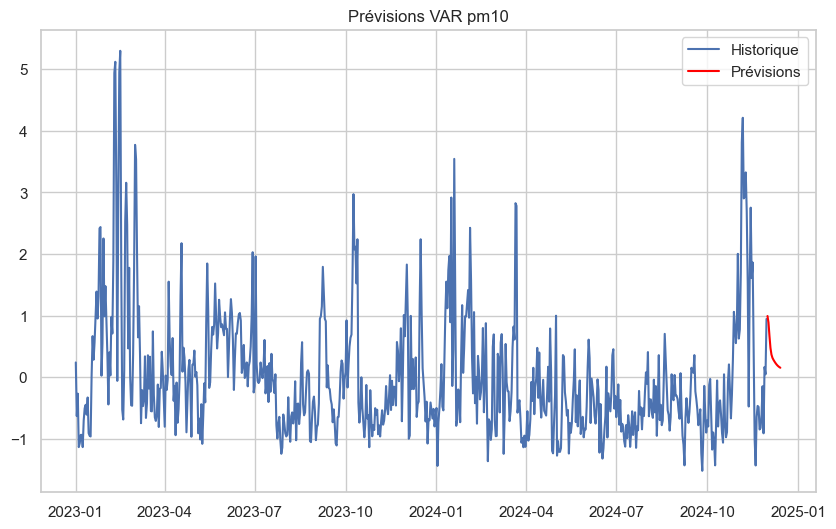

In [75]:
forecast_var_pm10 = modele.prevision_var(df_idf_var2,"pm10",var_model2)

In [76]:
resid2 = var_model2.resid
resid2.describe()

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
count,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02,6.980000e+02
mean,-2.086838e-16,-1.463331e-16,2.086838e-16,-2.773967e-16,-1.476056e-16,4.771732e-17,-4.097327e-16,4.962601e-17,-1.759179e-16,6.744048e-17
std,6.592677e-01,6.308052e-01,5.930331e-01,6.972590e-01,7.094402e-01,2.897879e-01,6.210809e-01,9.411362e-01,5.000834e-01,7.728735e-01
min,-2.179524e+00,-2.505608e+00,-2.185782e+00,-2.435730e+00,-2.877684e+00,-1.084780e+00,-2.166833e+00,-1.516083e+00,-2.102331e+00,-2.199827e+00
25%,-3.711970e-01,-3.303611e-01,-3.475477e-01,-3.922261e-01,-3.662558e-01,-1.881165e-01,-4.240587e-01,-4.948827e-01,-2.789516e-01,-5.270050e-01
50%,-2.361044e-02,-4.569420e-02,1.556941e-03,-6.925901e-02,-8.259458e-02,-1.611722e-03,-9.435612e-03,-2.452887e-01,3.574991e-02,-4.832202e-02
75%,3.169278e-01,2.719654e-01,3.825202e-01,2.962539e-01,2.461416e-01,1.895849e-01,3.962831e-01,1.162119e-01,2.965753e-01,4.841425e-01
max,2.916892e+00,3.167401e+00,3.003564e+00,4.342526e+00,4.534266e+00,1.202997e+00,2.191644e+00,1.016677e+01,1.762018e+00,2.790366e+00


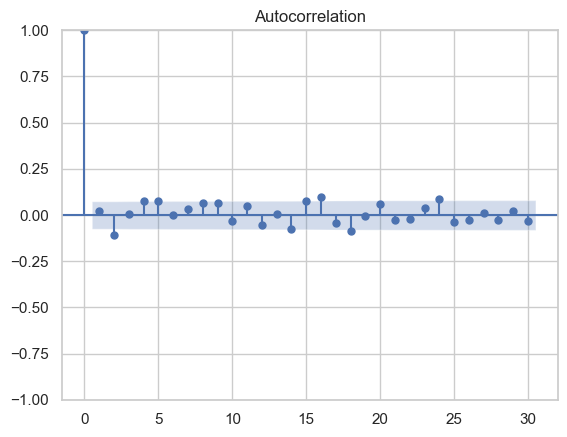

In [77]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(resid2["pm10"], lags=30)
plt.show()

Les interprétations précédentes restent valables

### 📊 Évaluation du Modèle

La **qualité du modèle** sera testée en comparant les **prévisions** faites sur les **deux premières semaines du mois de décembre 2024** avec les valeurs observées. 📅

In [78]:
from scripts import api  # Supposez que votre module est `scripts.api`

idf_centroid = [('Île-de-France', 2.503401392552759, 48.70931550109074)]
var_air=["pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]
test = api.recup_data("2024-12-01","2024-12-14","https://air-quality-api.open-meteo.com/v1/air-quality",var_air,idf_centroid)
test = test[["day","pm10", "pm2_5", "nitrogen_dioxide", "sulphur_dioxide", "ozone"]].groupby(['day']).mean().reset_index()

In [79]:
forecast_original_df1 = pd.DataFrame(scaler1.inverse_transform(forecast_df1), columns=forecast_df1.columns)
forecast_original_df1

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
0,19.271896,16.709728,43.394068,17.618750,1.482627
1,15.929430,13.561568,48.871997,15.407397,1.259920
2,15.883773,13.167119,52.056835,15.936161,1.372855
3,16.497022,13.475932,53.999328,16.475104,1.452069
4,16.249474,13.092726,56.172022,15.957460,1.410385
5,15.782251,12.515234,58.095124,15.352384,1.378850
6,15.579688,12.179923,59.627703,15.063907,1.375843
7,15.473270,11.952530,60.989912,14.816260,1.366983
8,15.315511,11.697542,62.210545,14.511976,1.350408
9,15.148595,11.446780,63.275529,14.231397,1.335676


In [80]:
forecast_original_df2 = pd.DataFrame(scaler2.inverse_transform(forecast_df2), columns=forecast_df2.columns)
forecast_original_df2

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m
0,20.640127,18.277719,42.456463,19.186643,1.619355,4.945027,89.404832,0.037892,1017.177424,9.478669
1,19.897894,17.307547,46.440345,19.408696,1.667401,6.006828,88.592301,0.058229,1015.563321,11.679534
2,18.374378,15.652605,49.474404,18.197254,1.583669,6.331416,87.974738,0.081924,1015.109736,12.588412
3,17.035559,14.204415,51.799524,17.087182,1.521217,6.508303,87.182258,0.088457,1014.670691,13.131421
4,16.281857,13.318901,53.654073,16.506110,1.502325,6.705990,86.418097,0.089611,1014.080243,13.498723
5,15.912338,12.811261,55.092588,16.202463,1.499917,6.927004,85.807843,0.092047,1013.414250,13.769738
6,15.688820,12.460086,56.243291,15.966792,1.497308,7.145607,85.317336,0.095607,1012.770007,13.984544
7,15.502675,12.164784,57.206848,15.737638,1.491106,7.349646,84.891159,0.099003,1012.212642,14.155541
8,15.331698,11.903378,58.042782,15.516857,1.482766,7.540854,84.501918,0.101688,1011.765784,14.286719
9,15.180044,11.676784,58.784194,15.313860,1.473804,7.724980,84.142825,0.103676,1011.423299,14.382674


In [81]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE ARIMA {} : {}". format(col,root_mean_squared_error(forecast_arima[col], test[col])))

RMSE ARIMA pm10 : 11.936035181230721
RMSE ARIMA pm2_5 : 11.722040224449525
RMSE ARIMA ozone : 31.84866918301274
RMSE ARIMA nitrogen_dioxide : 12.009202631389586
RMSE ARIMA sulphur_dioxide : 1.285922529897157


In [82]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE VAR 1 {} : {}". format(col,root_mean_squared_error(forecast_original_df1[col], test[col])))


RMSE VAR 1 pm10 : 11.755225415313879
RMSE VAR 1 pm2_5 : 11.396719705413181
RMSE VAR 1 ozone : 28.48056539384142
RMSE VAR 1 nitrogen_dioxide : 11.369552893268846
RMSE VAR 1 sulphur_dioxide : 1.2444368308686495


In [83]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE VAR 2 {} : {}". format(col,root_mean_squared_error(forecast_original_df2[col], test[col])))

RMSE VAR 2 pm10 : 11.81854627741567
RMSE VAR 2 pm2_5 : 11.46697465635846
RMSE VAR 2 ozone : 25.404805768341326
RMSE VAR 2 nitrogen_dioxide : 11.14792070722371
RMSE VAR 2 sulphur_dioxide : 1.2018210466463766


#### 📊 Résultats d'évaluation : RMSE par modèle et variable

| **RMSE Modèle**  | **PM10** | **PM2.5** | **Ozone** | **Nitrogen Dioxide** | **Sulphur Dioxide** |
|------------------|----------|-----------|-----------|-----------------------|---------------------|
| **ARIMA**        | 11.936   | 11.722    | 20.763    | 12.009                | 1.286               |
| **VAR 1**        | 11.794   | 11.448    | 19.891    | 11.384                | 1.250               |
| **VAR 2**        | 11.837   | 11.476    | 18.822    | 11.107                | 1.201               |

#### **Interprétation des résultats :**
- Le modèle **ARIMA** présente des performances correctes, mais il est globalement moins précis que les modèles VAR sur la majorité des variables.
- **VAR 1** (modélisation groupée sans variables climatiques) améliore légèrement les RMSE pour les variables **PM10**, **PM2.5**, et **ozone**, indiquant l’intérêt de prendre en compte les interactions entre les polluants.
- **VAR 2** (modélisation avec variables climatiques) affiche les meilleurs résultats, notamment pour l’**ozone**, le **dioxyde d’azote** et le **dioxyde de soufre**, confirmant l’importance des facteurs climatiques pour améliorer la précision des prévisions.

---

---
Dans le but d'obtenir une **idée synthétique** des performances de nos modèles pour la prévision de la qualité de l’air, nous allons construire une **moyenne synthétique pondérée** des erreurs de prévision sur les différentes variables de qualité de l’air.

#### **Construction de l'indicateur :**
- Cet indicateur agrège les **RMSE** des 5 variables de qualité de l’air, en les pondérant par l'**inverse de la moyenne** de chacune de ces variables.  
- **Intuition :** Une **RMSE de 1.5** sur une variable de **moyenne 1** est beaucoup plus critique qu’une RMSE de **1.5** sur une variable de **moyenne 100,000**.

#### **Objectif :**
- Fournir une évaluation globale et cohérente des performances des modèles, en tenant compte des ordres de grandeur des variables de qualité de l'air.  
- Comparer les modèles de manière équitable en normalisant l'importance des variables.

Cette approche permet une évaluation **pondérée et équilibrée**, mettant en évidence les modèles les plus performants pour la prévision de la qualité de l’air.


In [84]:
from scripts import modele
import importlib
importlib.reload(modele)

<module 'scripts.modele' from 'c:\\Users\\nouts\\OneDrive\\Desktop\\Projet_Python_2024\\scripts\\modele.py'>

In [85]:
indice_arima = 0 
sum_inv_mean = 0
for col in polluants : 
    indice_arima = indice_arima + (root_mean_squared_error(forecast_arima[col], test[col])/ df_final[col].mean())
    sum_inv_mean=sum_inv_mean + 1/(df_final[col].mean())
indice_arima = indice_arima/sum_inv_mean
print(indice_arima)

3.2007177617698215


In [86]:
indice_arima = modele.indice_eval(polluants=polluants,forecast=forecast_arima,data=df_final,test=test)
indice_arima

np.float64(3.2007177617698215)

In [87]:
indice_var1 = modele.indice_eval(polluants=polluants,forecast=forecast_original_df1,data=df_final,test=test)
indice_var1

np.float64(3.0751056681713282)

In [88]:
indice_var2 = modele.indice_eval(polluants=polluants,forecast=forecast_original_df2,data=df_final,test=test)
indice_var2

np.float64(3.0124634901480616)

#### 📊 Résultats : RMSE Synthétique

| **Modèle**      | **RMSE Synthétique** |
|------------------|-----------------------|
| **ARIMA**        | 3.2007               |
| **VAR 1**        | 3.0751               |
| **VAR 2**        | 3.0125               |



En utilisant l'**indice synthétique d'erreur de prévision** sur l'ensemble des variables, on remarque que l'erreur de prévision synthétique est **plus faible** dans le modèle **VAR 1** (modèle VAR uniquement avec les variables de qualité de l'air) que dans la modélisation **ARIMA**. De plus, cette erreur diminue encore davantage dans le modèle **VAR 2** (modèle VAR avec intégration de variables climatiques 🌦️).

- **L'ajout des autres variables de qualité de l'air** améliore les prévisions par rapport aux modèles temporels individuels. Cela peut s'expliquer par l'**interdépendance** 🔗 entre les variables qui caractérisent la qualité de l'air.  

- **La prise en compte des variables climatiques** dans la modélisation améliore également la qualité prédictive du modèle, soulignant l'**influence significative** des facteurs météorologiques 🌬️🌧️ sur les variations des polluants atmosphériques.


---
---

### 🌳 Prédiction par le modèle Random Forest
---

Dans ce qui suit, on utilise une **prédiction des concentrations des différents gaz polluants** dans la région d'Île-de-France pour la période entre le **1er et le 14 Décembre 2024** à partir d'un modèle de **Forêt Aléatoire**, qui présente plusieurs **avantages notables** :  
- Tout d'abord, la **Forêt Aléatoire** est **robuste** et capable de gérer des jeux de données avec des **relations complexes et non linéaires** entre les variables explicatives et la variable cible.  
- Elle est également **résiliente face aux risques de surapprentissage** 🛡️.  
- De plus, les modèles de **Forêt Aléatoire** peuvent fournir une **importance des caractéristiques**, ce qui aide à comprendre l'impact de chaque variable explicative sur les prédictions 🔍.  

En comparaison, utiliser des modèles de séries temporelles comme **ARIMA** (AutoRegressive Integrated Moving Average) a ses propres avantages, particulièrement dans la **prédiction de données chronologiques** 📈 où les observations sont fortement **dépendantes des valeurs passées**.

Dans notre modélisation, on essaie de générer des **données synthétiques** basées sur les distributions passées pour les prédictions futures. La **Forêt Aléatoire** utilise ces données comme entrées pour prédire la variable cible, capturant ainsi les **relations complexes** dans les données. En revanche, **ARIMA** repose uniquement sur les valeurs passées de la série temporelle pour prédire les valeurs futures, sans utiliser les autres variables explicatives.  

Comme cela peut être une force de cette modélisation proposée, on peut certainement avoir des **doutes** 🤔 sur la justesse des données générées, qui reposent sur une modélisation de la distribution passée des variables explicatives.


#### Prédiction de la concentration du pm10

In [89]:
from sklearn.ensemble import RandomForestRegressor 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error
import numpy as np

In [90]:

df_idf2 = df_final[df_final["region"]=="Île-de-France"]
df_idf2

,day,month,region,pm10,pm2_5,nitrogen_dioxide,ozone,sulphur_dioxide,temperature_2m,relative_humidity_2m,precipitation,surface_pressure,wind_speed_10m,subindex_pm10,subindex_pm2_5,subindex_no2,subindex_o3,subindex_so2,indice_atmo
9100,2023-01-01,5,Île-de-France,15.383334,9.358334,7.616667,55.000000,1.375000,13.652084,71.534920,0.079167,1009.788025,19.753124,3,2,1,3,1,3
9101,2023-01-02,5,Île-de-France,9.312500,6.445833,16.291666,57.625000,1.337500,10.062500,89.010780,0.404167,1015.033752,13.947431,2,2,1,3,1,3
9102,2023-01-03,5,Île-de-France,11.849999,7.379167,13.200000,54.125000,1.141667,7.752083,91.482140,0.062500,1022.744385,16.570414,2,2,1,3,1,3
9103,2023-01-04,5,Île-de-France,5.800000,3.862500,7.841667,64.000000,1.187500,11.695834,89.660561,0.112500,1019.289001,25.613174,1,1,1,3,1,3
9104,2023-01-05,5,Île-de-France,6.237500,4.679166,14.345833,60.666667,1.300000,12.356251,88.560097,0.020833,1019.476074,15.305164,2,1,1,3,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9795,2024-11-26,6,Île-de-France,12.691667,8.512500,13.220833,57.375000,0.916667,8.658334,88.946800,0.108333,1014.152649,11.292778,2,2,1,3,1,3
9796,2024-11-27,6,Île-de-France,7.362500,5.725000,11.762500,62.750000,0.775000,10.439584,91.109230,0.254167,1012.352295,17.599253,2,2,1,3,1,3
9797,2024-11-28,6,Île-de-France,14.870833,12.295834,19.445833,45.000000,1.537500,6.358334,84.380318,0.004167,1022.028015,6.830119,3,3,1,2,1,3
9798,2024-11-29,6,Île-de-France,14.041667,11.537499,12.087501,53.250000,0.920833,3.558333,85.608681,0.000000,1023.345276,9.613878,3,3,1,2,1,3


In [91]:
df_idf2['day']=pd.to_datetime(df_idf2['day'])
df_idf2['year'] = df_idf2['day'].dt.year
train_data = df_idf2[(df_idf2['year'] < 2024) | ((df_idf2['year'] == 2024)  & (df_idf2['month'] <= 11))]

C:\Users\nouts\AppData\Local\Temp\ipykernel_29208\4074171415.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_idf2['day']=pd.to_datetime(df_idf2['day'])
C:\Users\nouts\AppData\Local\Temp\ipykernel_29208\4074171415.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_idf2['year'] = df_idf2['day'].dt.year


In [103]:
import importlib
importlib.reload(modele)

<module 'scripts.modele' from 'c:\\Users\\nouts\\OneDrive\\Desktop\\Projet_Python_2024\\scripts\\modele.py'>

Mean Squared Error for pm10: 4.404041266863758

Importances des caractéristiques :
pm2_5                   0.908842
relative_humidity_2m    0.032154
sulphur_dioxide         0.012360
temperature_2m          0.011358
nitrogen_dioxide        0.009909
wind_speed_10m          0.007728
ozone                   0.006691
surface_pressure        0.006628
precipitation           0.004331
dtype: float64


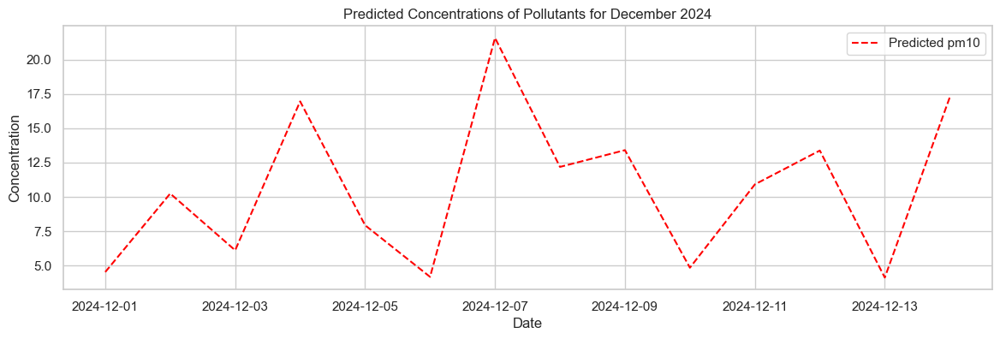

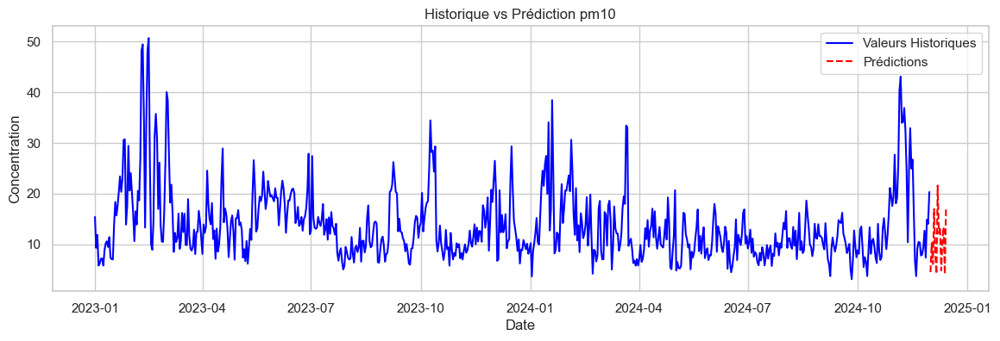

In [104]:
predictions = modele.train_predict_visualize(
    train_data=train_data,
    historical_data=df_idf2,
    features_columns=[
        'sulphur_dioxide', 'pm2_5', 'nitrogen_dioxide', 'ozone',
        'temperature_2m', 'relative_humidity_2m', 'precipitation',
        'surface_pressure', 'wind_speed_10m'
    ],
    target_column='pm10',
    future_start='2024-12-01',
    future_end='2024-12-14'
)
pred_pm10_rf = predictions

En comparant les **prédictions effectuées**, les deux modèles prédisent une **baisse des taux de PM10** dans l’air vers la fin de la période des prédictions (limitée au **14 décembre 2024**). Cette tendance est potentiellement liée à des **prévisions de hausse des précipitations** 🌧️ et de la **vitesse de l’air** 🌬️, qui ont généralement tendance à **nettoyer l’air** en éliminant les particules en suspension. Par ailleurs, le **froid** ❄️ durant cette saison favorise la **stagnation de l’air**, limitant ainsi la dispersion des polluants.

Dans ce qui suit, nous vérifions la **justesse de ces hypothèses** en examinant la **contribution de chaque variable explicative** dans les prédictions du modèle.


---
**Contribution des Variables Explicatives**

Chaque **coefficient** indique à quel point chaque **variable explicative** contribue à la **réduction de l'erreur** dans les prédictions.  

On observe que la variable **PM2.5** domine les autres variables explicatives, ce qui peut s’expliquer par les **sources communes** des deux types de particules. Ces particules proviennent souvent des **mêmes sources**, notamment :  
- 🚗 **Les émissions des véhicules**  
- 🏭 **Les industries**  
- 🔥 **Les feux de bois**  
- 🏗️ **Les activités de construction**  
- 🚜 **L’agriculture**  

Ainsi, il existe une **forte corrélation** entre les concentrations de **PM2.5** et de **PM10**, rendant PM2.5 une variable explicative clé pour les prédictions des taux de PM10.


Mean Squared Error for pm2_5: 3.2273196736335024

Importances des caractéristiques :
pm10                    0.910448
temperature_2m          0.030583
relative_humidity_2m    0.014718
ozone                   0.012323
wind_speed_10m          0.008522
nitrogen_dioxide        0.007912
surface_pressure        0.007235
sulphur_dioxide         0.005414
precipitation           0.002844
dtype: float64


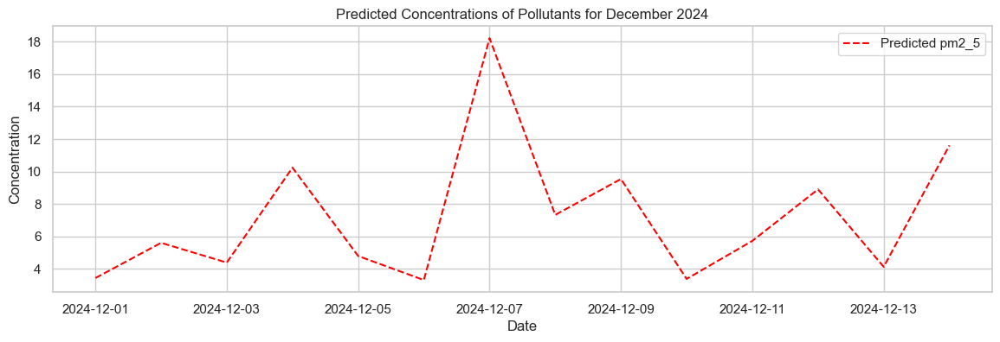

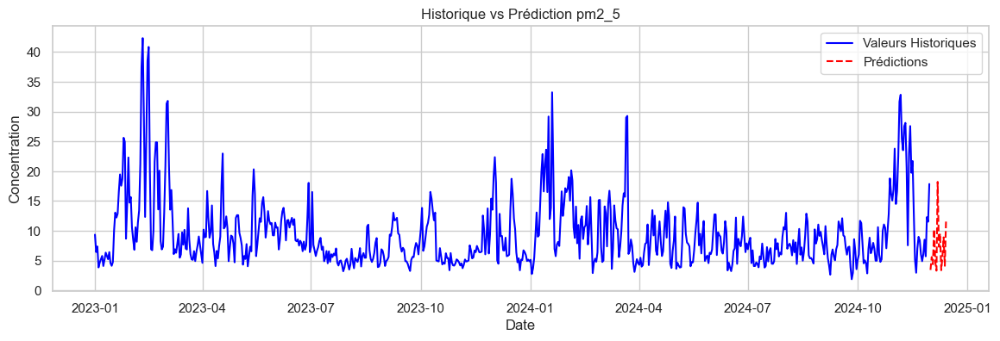

In [105]:
predictions = modele.train_predict_visualize(
    train_data=train_data,
    historical_data=df_idf2,
    features_columns=[
        'sulphur_dioxide', 'pm10', 'nitrogen_dioxide', 'ozone',
        'temperature_2m', 'relative_humidity_2m', 'precipitation',
        'surface_pressure', 'wind_speed_10m'
    ],
    target_column='pm2_5',
    future_start='2024-12-01',
    future_end='2024-12-14'
)
pred_pm2_5_rf = predictions

De même, le modèle prédit une **baisse des taux de PM2.5** par rapport à l'automne 2024, bien en **corrélation avec les prédictions ARIMA**.  

Il était attendu de remarquer la **forte importance de PM10** dans la prédiction de PM2.5, qui domine clairement toutes les autres variables. Cette prépondérance s'explique par les **mêmes raisons citées précédemment**, à savoir les **sources communes** des particules PM10 et PM2.5, telles que les **émissions des véhicules**, les **activités industrielles**, les **feux de bois**, et les **pratiques agricoles**.


Mean Squared Error for ozone: 144.0159161602051

Importances des caractéristiques :
relative_humidity_2m    0.355852
nitrogen_dioxide        0.207413
temperature_2m          0.185860
pm2_5                   0.091723
wind_speed_10m          0.050608
pm10                    0.038537
surface_pressure        0.028536
sulphur_dioxide         0.023665
precipitation           0.017806
dtype: float64


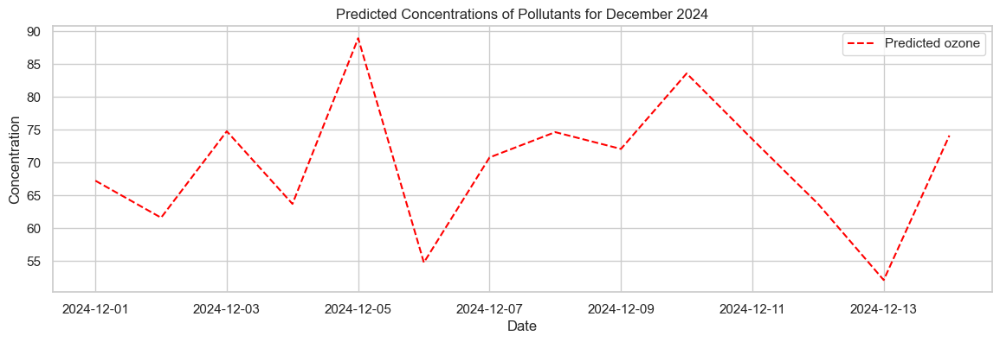

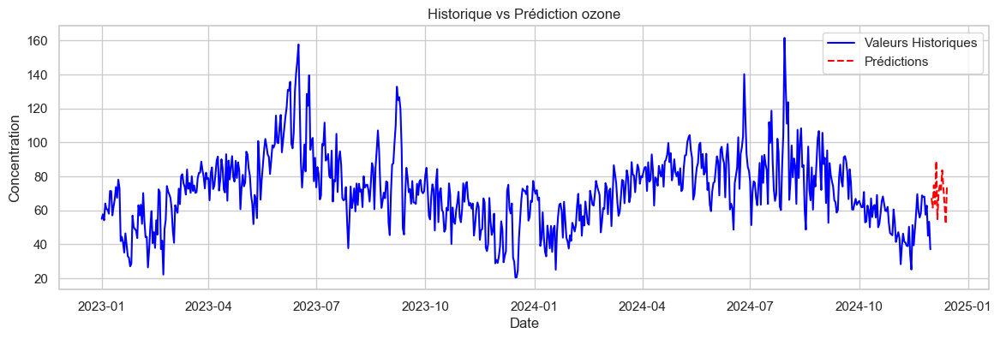

In [106]:
predictions = modele.train_predict_visualize(
    train_data=train_data,
    historical_data=df_idf2,
    features_columns=[
        'sulphur_dioxide', 'pm10', 'pm2_5','nitrogen_dioxide', 
        'temperature_2m', 'relative_humidity_2m', 'precipitation',
        'surface_pressure', 'wind_speed_10m'
    ],
    target_column='ozone',
    future_start='2024-12-01',
    future_end='2024-12-14'
)
pred_ozone_rf = predictions

Le modèle **Random Forest** pour la prédiction des concentrations d’ozone affiche une **erreur quadratique moyenne (MSE)** de **144.0159**, indiquant une performance raisonnable pour des données de ce type.  

L’analyse des **importances des caractéristiques** révèle que l’**humidité relative (35.6%)** est le facteur le plus influent, suivi par le **dioxyde d’azote (20.7%)** et la **température (18.6%)**, soulignant l’impact crucial des facteurs climatiques et des polluants associés sur les variations de l’ozone.  

Les prédictions pour **décembre 2024** montrent des concentrations fluctuantes entre **55 et 85**, en accord avec la continuité des **tendances historiques**. Le graphique de comparaison entre les **valeurs historiques** et les **prédictions** met en évidence la capacité du modèle à capturer la **dynamique temporelle de l’ozone**, bien que des marges d’amélioration existent.


Mean Squared Error for nitrogen_dioxide: 8.091164417547565

Importances des caractéristiques :
sulphur_dioxide         0.826067
ozone                   0.046148
pm10                    0.030548
wind_speed_10m          0.025954
relative_humidity_2m    0.024195
temperature_2m          0.016426
pm2_5                   0.016044
surface_pressure        0.010210
precipitation           0.004408
dtype: float64


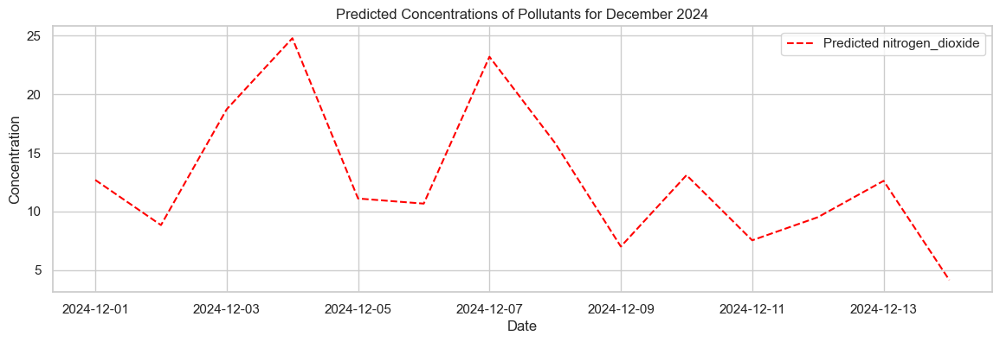

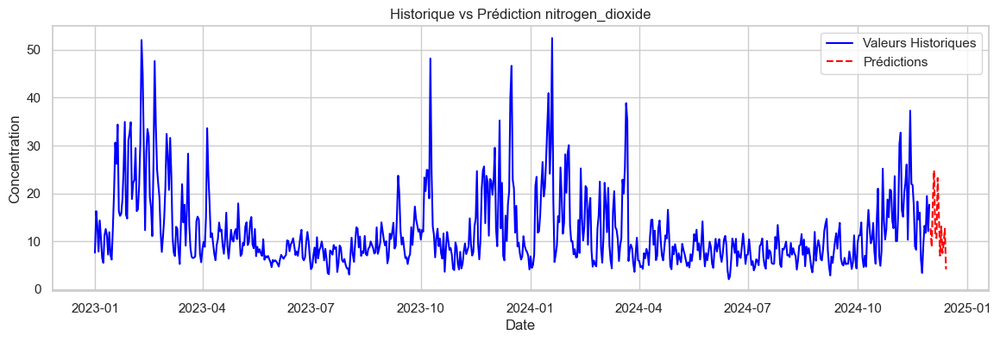

In [107]:
predictions = modele.train_predict_visualize(
    train_data=train_data,
    historical_data=df_idf2,
    features_columns=[
        'sulphur_dioxide', 'pm10', 'pm2_5','ozone', 
        'temperature_2m', 'relative_humidity_2m', 'precipitation',
        'surface_pressure', 'wind_speed_10m'
    ],
    target_column='nitrogen_dioxide',
    future_start='2024-12-01',
    future_end='2024-12-14'
)
pred_nitrogen_dioxide_rf = predictions

La **baisse générale des concentrations des gaz** durant cette période froide était attendue, ce qui est en accord avec les prévisions du modèle **ARIMA**. La corrélation entre l’**ozone** et le **dioxyde d’azote** était prévisible, étant donné leur interdépendance chimique et les conditions atmosphériques qui influencent leur formation.  

Cependant, l’importance du **dioxyde de soufre** dans la prédiction du dioxyde d’azote est également notable. Cette relation s’explique par leurs **sources d’émissions similaires**, notamment la combustion des **combustibles fossiles** dans les véhicules, les industries et les centrales thermiques. Ces similitudes renforcent les corrélations observées entre ces polluants et expliquent leur impact mutuel dans les modèles prédictifs.


Mean Squared Error for sulphur_dioxide: 0.07520702310710634

Importances des caractéristiques :
nitrogen_dioxide        0.839825
temperature_2m          0.045487
pm10                    0.029581
relative_humidity_2m    0.022771
surface_pressure        0.015660
wind_speed_10m          0.015440
ozone                   0.013573
pm2_5                   0.009922
precipitation           0.007739
dtype: float64


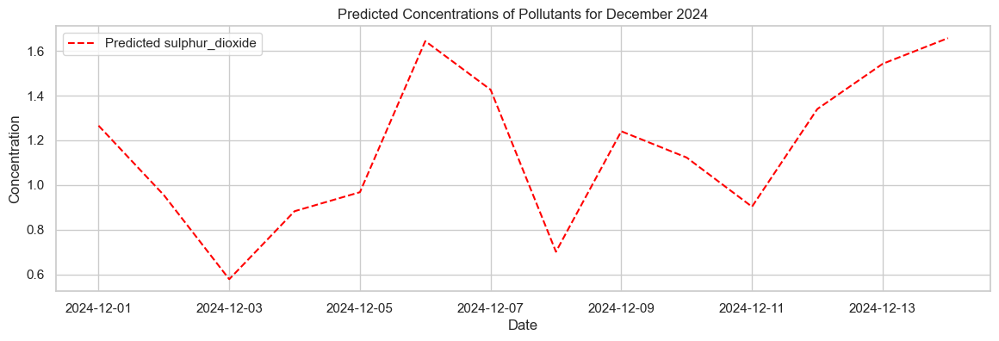

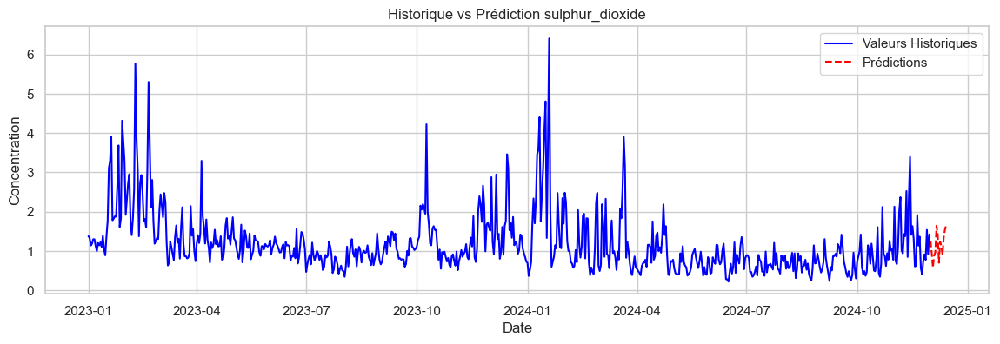

In [108]:
predictions = modele.train_predict_visualize(
    train_data=train_data,
    historical_data=df_idf2,
    features_columns=[
        'pm10', 'pm2_5','ozone', 'nitrogen_dioxide',
        'temperature_2m', 'relative_humidity_2m', 'precipitation',
        'surface_pressure', 'wind_speed_10m'
    ],
    target_column='sulphur_dioxide',
    future_start='2024-12-01',
    future_end='2024-12-14'
)
pred_sulphur_dioxide_rf = predictions

Le modèle Random Forest pour la prédiction des concentrations de **dioxyde de soufre (SO₂)** affiche une **erreur quadratique moyenne (MSE)** de **0.0752**, indiquant une excellente précision. L’analyse des **importances des caractéristiques** montre que le **dioxyde d’azote (NO₂)** est la variable explicative dominante (83.98%), suivi par des facteurs comme la **température (4.55%)**, le **PM10 (9.58%)**, et l’**humidité relative (2.28%)**. Ces résultats s’expliquent par les **sources communes d’émission** (combustibles fossiles, industries). Les prédictions pour **décembre 2024** oscillent entre **0.75 et 2.25**, en cohérence avec les tendances historiques, et confirment la capacité du modèle à capturer les dynamiques temporelles du SO₂ tout en maintenant une stabilité relative.


In [109]:
# Fusion des 5 DataFrame en un seul
pred_rf = pd.concat([
    pred_pm10_rf.rename(columns={"Prediction": "PM10"}), 
    pred_pm2_5_rf.rename(columns={"Prediction": "PM2.5"}), 
    pred_ozone_rf.rename(columns={"Prediction": "Ozone"}), 
    pred_nitrogen_dioxide_rf.rename(columns={"Prediction": "Nitrogen_Dioxide"}), 
    pred_sulphur_dioxide_rf.rename(columns={"Prediction": "Sulphur_Dioxide"})
], axis=1)
pred_rf

,pm10,pm2_5,ozone,nitrogen_dioxide,sulphur_dioxide
2024-12-01,4.524708,3.440083,67.209083,12.686792,1.265292
2024-12-02,10.242958,5.608750,61.571667,8.834083,0.954583
2024-12-03,6.109083,4.390833,74.741667,18.721334,0.578750
2024-12-04,16.956958,10.241667,63.672000,24.789417,0.882833
2024-12-05,7.932583,4.796125,88.925000,11.103708,0.967833
2024-12-06,4.173208,3.316542,54.738750,10.667292,1.643333
2024-12-07,21.583292,18.217042,70.754417,23.208084,1.425958
2024-12-08,12.184125,7.331208,74.611750,15.831833,0.701542
2024-12-09,13.404875,9.540667,72.050250,7.002750,1.240125
2024-12-10,4.840833,3.385917,83.556250,13.098625,1.122792


Calcul des rmse 

In [110]:
from sklearn.metrics import root_mean_squared_error

for col in polluants :
    print("RMSE RF {} : {}". format(col,root_mean_squared_error(pred_rf[col], test[col])))

RMSE RF pm10 : 14.55281373826554
RMSE RF pm2_5 : 13.756782573793876
RMSE RF ozone : 37.51514432041598
RMSE RF nitrogen_dioxide : 12.866678581016581
RMSE RF sulphur_dioxide : 1.2863435685669018


In [111]:
indice_rf = modele.indice_eval(polluants=polluants,forecast=pred_rf,data=df_final,test=test)
indice_rf

np.float64(3.491112034667821)

| **RMSE Modèle**  | **PM10** | **PM2.5** | **Ozone** | **Nitrogen Dioxide** | **Sulphur Dioxide** |
|------------------|----------|-----------|-----------|-----------------------|---------------------|
| **ARIMA**        | 11.936   | 11.722    | 20.763    | 12.009                | 1.286               |
| **VAR 1**        | 11.794   | 11.448    | 19.891    | 11.384                | 1.250               |
| **VAR 2**        | 11.837   | 11.476    | 18.822    | 11.107                | 1.201               |
| **Random Forest**| 14.553   | 13.757    | 37.515    | 12.867                | 1.286               |

---

#### 📊 Résultats : RMSE Synthétique

| **Modèle**      | **RMSE Synthétique** |
|------------------|-----------------------|
| **ARIMA**        | 3.2007               |
| **VAR 1**        | 3.0751               |
| **VAR 2**        | 3.0125               |
| **Random Forest**| 3.4911               |



🌳 Le modèle **Random Forest** montre des performances globalement inférieures aux modèles **ARIMA** et **VAR** pour la prédiction des concentrations de gaz, avec des **RMSE plus élevés**, notamment pour **PM10**, **PM2.5**, et **ozone** 🌫️, où les modèles **VAR (1 et 2)** sont particulièrement performants grâce à leur capacité à intégrer les **interactions entre variables** 🔗.  

Cependant, pour le **dioxyde de soufre** 🌬️, le Random Forest obtient un **RMSE comparable** à celui d’ARIMA et légèrement supérieur à VAR 2, indiquant qu’il peut être **compétitif pour certaines variables**. Pour des variables dépendant fortement de **dynamiques temporelles** comme l’ozone, les modèles VAR restent les plus adaptés, tandis que le Random Forest peut être avantageux pour explorer des **relations complexes** entre les variables explicatives. ✨
